# Gráficos en Colaboratory


Un uso común de los cuadernos es la visualización de datos mediante gráficos. Colaboratory lo hace fácil con varias herramientas de gráficos disponibles como importaciones de Python.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/Frustra/Dynamic_plots_res_ALL_concatenate.zip -d /content/

Archive:  /content/drive/MyDrive/Frustra/Dynamic_plots_res_ALL_concatenate.zip
   creating: /content/Dynamic_plots_res_50_X/
  inflating: /content/Dynamic_plots_res_50_X/singleresidue_Res_50_X  
  inflating: /content/Dynamic_plots_res_50_X/dynamic_IndexFrustration_singleresidue_Res50.png  
  inflating: /content/Dynamic_plots_res_50_X/mutational_Res_50_X  
  inflating: /content/Dynamic_plots_res_50_X/dynamic5adens_mutational_Res50.png  
  inflating: /content/Dynamic_plots_res_50_X/dynamicHist5adens_mutational_Res_50_X.png  
  inflating: /content/Dynamic_plots_res_50_X/configurational_Res_50_X  
  inflating: /content/Dynamic_plots_res_50_X/dynamic5adens_configurational_Res50.png  
  inflating: /content/Dynamic_plots_res_50_X/dynamicHist5adens_configurational_Res_50_X.png  
   creating: /content/Dynamic_plots_res_51_X/
  inflating: /content/Dynamic_plots_res_51_X/singleresidue_Res_51_X  
  inflating: /content/Dynamic_plots_res_51_X/dynamic_IndexFrustration_singleresidue_Res51.png  
  infl

# Contact Map Based approach

In [ ]:
#craer data frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
#df = pd.read_csv('df.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df = pd.read_csv('/content/drive/MyDrive/Frustra/NativeStates/alfa_pdb_configurational.txt' , sep='\s+', header=None, names=['#Res1','Res2','ChainRes1','ChainRes2','DensityRes1','DensityRes2','AA1','AA2','NativeEnergy','DecoyEnergy','SDEnergy','FrstIndex','Welltype','FrstState'], skiprows=1)
df


,#Res1,Res2,ChainRes1,ChainRes2,DensityRes1,DensityRes2,AA1,AA2,NativeEnergy,DecoyEnergy,SDEnergy,FrstIndex,Welltype,FrstState
0,1,3,A,A,1.000,1.824,M,S,-1.427,-1.407,0.492,0.041,short,neutral
1,1,60,A,A,1.000,2.012,M,D,-1.213,-1.407,0.492,-0.395,short,neutral
2,1,61,A,A,1.000,0.803,M,P,-1.908,-1.407,0.492,1.018,water-mediated,minimally
3,1,62,A,A,1.000,0.000,M,E,-1.523,-1.407,0.492,0.236,water-mediated,neutral
4,1,63,A,A,1.000,0.000,M,V,-1.764,-1.407,0.492,0.725,water-mediated,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
826,155,157,A,A,0.000,0.001,K,T,-1.422,-1.407,0.492,0.031,water-mediated,neutral
827,156,158,A,A,1.074,1.001,N,E,-1.363,-1.407,0.492,-0.090,short,neutral
828,157,159,A,A,0.001,0.000,T,F,-1.026,-1.407,0.492,-0.775,water-mediated,neutral
829,158,160,A,A,1.001,0.126,E,R,-1.777,-1.407,0.492,0.753,short,neutral


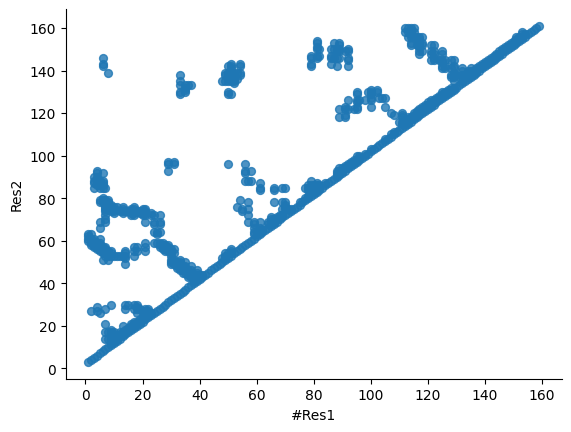

In [ ]:
# @title #Res1 vs Res2

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='#Res1', y='Res2', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

<ipython-input-9-11ca6050a89f>:21: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap))


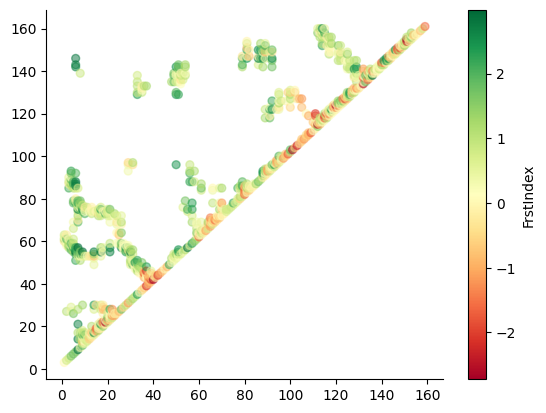

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np

# Normalizamos los valores de 'FrstIndex' al rango [0, 1]
norm = plt.Normalize(df['FrstIndex'].min(), df['FrstIndex'].max())

# Usamos el colormap 'RdYlGn'
cmap = plt.get_cmap('RdYlGn')

# Obtenemos los colores para cada punto
colors = cmap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=32, alpha=.5)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap))
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()


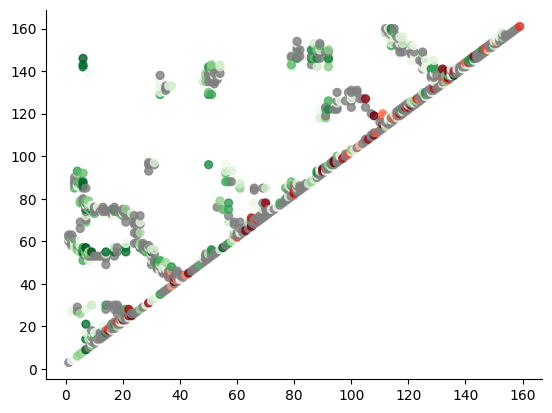

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Función para mapear valores a colores según los rangos especificados
def color_map(value):
    if value > 0.78:
        norm_value = (value - 0.78) / (df['FrstIndex'].max() - 0.78)
        return plt.get_cmap('Greens')(norm_value)
    elif value >= -1:
        return (0.5, 0.5, 0.5, 1)  # Gris
    else:
        norm_value = (value - df['FrstIndex'].min()) / (-1 - df['FrstIndex'].min())
        return plt.get_cmap('Reds')(norm_value)

# Aplicamos la función para obtener los colores
colors = df['FrstIndex'].apply(color_map)

# Graficamos los puntos con los colores asignados
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=32, alpha=.8)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Mostramos el gráfico
plt.show()


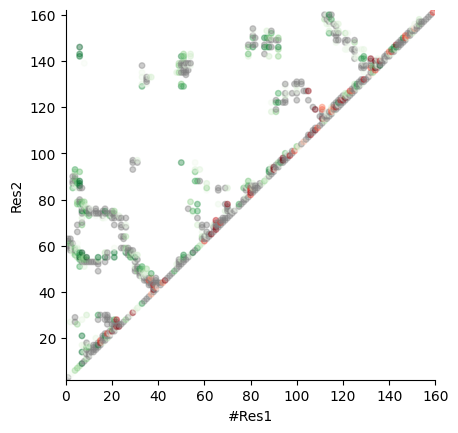

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Creamos un DataFrame de ejemplo (sólo si no tienes el DataFrame original)
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100) * 10 - 5,
#     'Res2': np.random.rand(100) * 10 - 5,
#     'FrstIndex': np.random.rand(100) * 10 - 5
# })

# Función para mapear valores a colores según los rangos especificados
def color_map(value):
    if value > 0.78:
        norm_value = (value - 0.78) / (df['FrstIndex'].max() - 0.78)
        return plt.get_cmap('Greens')(norm_value)
    elif value >= -1:
        return (0.5, 0.5, 0.5, 1)  # Gris
    else:
        norm_value = (value - df['FrstIndex'].min()) / (-1 - df['FrstIndex'].min())
        return plt.get_cmap('Reds')(norm_value)

# Aplicamos la función para obtener los colores
colors = df['FrstIndex'].apply(color_map)

# Configuramos la figura y los ejes para un aspecto cuadrado
fig, ax = plt.subplots()
ax.set_aspect('equal')

# Graficamos los puntos con los colores asignados
scatter = ax.scatter(df['#Res1'], df['Res2'], c=colors, s=16, alpha=.4)

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Ajustamos los límites de los ejes para asegurar un aspecto cuadrado
ax.set_xlim(df['#Res1'].min() - 1, df['#Res1'].max() + 1)
ax.set_ylim(df['Res2'].min() - 1, df['Res2'].max() + 1)

# Etiquetas y título del gráfico
ax.set_xlabel('#Res1')
ax.set_ylabel('Res2')
#ax.set_title('Scatter plot of #Res1 vs Res2 colored by FrstIndex')
# Agregamos una barra de color para mostrar la escala de 'FrstIndex'

# Mostramos el gráfico
plt.show()


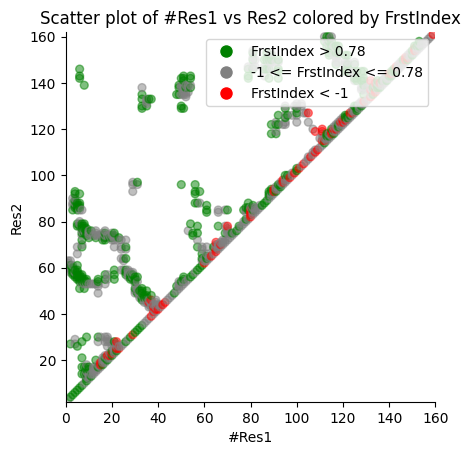

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np

# Función para mapear valores a colores según los rangos especificados
def color_map(value):
    if value > 0.78:
        return 'green'
    elif value >= -1:
        return 'grey'
    else:
        return 'red'

# Aplicamos la función para obtener los colores
colors = df['FrstIndex'].apply(color_map)

# Configuramos la figura y los ejes para un aspecto cuadrado
fig, ax = plt.subplots()
ax.set_aspect('equal')

# Graficamos los puntos con los colores asignados
scatter = ax.scatter(df['#Res1'], df['Res2'], c=colors, s=32, alpha=.5)

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Ajustamos los límites de los ejes para asegurar un aspecto cuadrado
ax.set_xlim(df['#Res1'].min() - 1, df['#Res1'].max() + 1)
ax.set_ylim(df['Res2'].min() - 1, df['Res2'].max() + 1)

# Etiquetas y título del gráfico
ax.set_xlabel('#Res1')
ax.set_ylabel('Res2')
ax.set_title('Scatter plot of #Res1 vs Res2 colored by FrstIndex')

# Añadimos una leyenda manual
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='FrstIndex > 0.78'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='grey', markersize=10, label='-1 <= FrstIndex <= 0.78'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='FrstIndex < -1')
]

ax.legend(handles=legend_elements, loc='upper right')

# Mostramos el gráfico
plt.show()


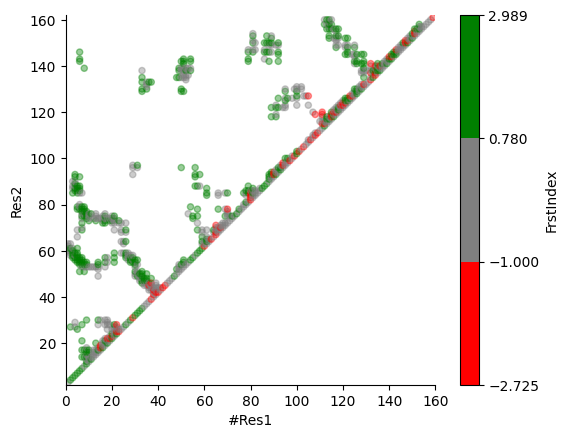

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np

# Función para mapear valores a colores según los rangos especificados
def color_map(value):
    if value > 0.78:
        return 'green'
    elif value >= -1:
        return 'grey'
    else:
        return 'red'

# Aplicamos la función para obtener los colores
colors = df['FrstIndex'].apply(color_map)

# Configuramos la figura y los ejes para un aspecto cuadrado
fig, ax = plt.subplots()
ax.set_aspect('equal')

# Graficamos los puntos con los colores asignados
scatter = ax.scatter(df['#Res1'], df['Res2'], c=colors, s=20, alpha=.4)

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Ajustamos los límites de los ejes para asegurar un aspecto cuadrado
ax.set_xlim(df['#Res1'].min() - 1, df['#Res1'].max() + 1)
ax.set_ylim(df['Res2'].min() - 1, df['Res2'].max() + 1)

# Etiquetas y título del gráfico
ax.set_xlabel('#Res1')
ax.set_ylabel('Res2')
#ax.set_title('Scatter plot of #Res1 vs Res2 colored by FrstIndex')

# Creamos una barra de color personalizada
import matplotlib.colors as mcolors

# Definimos los segmentos de color
cmap = mcolors.ListedColormap(['red', 'grey', 'green'])
bounds = [df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Añadimos la barra de color al gráfico
cbar = plt.colorbar(
    plt.cm.ScalarMappable(norm=norm, cmap=cmap),
    ax=ax,
    boundaries=bounds,
    ticks=[df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
)
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()


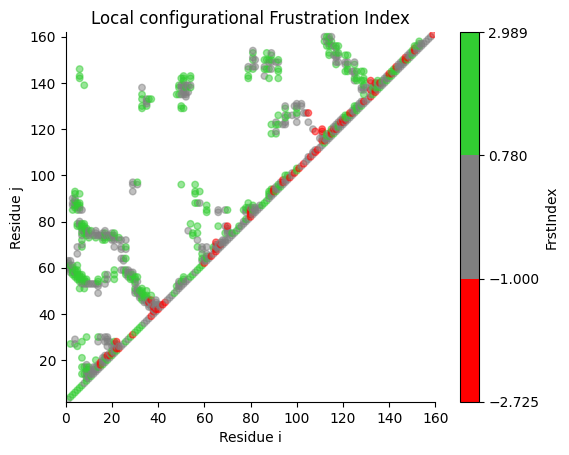

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np

# Función para mapear valores a colores según los rangos especificados
def color_map(value):
    if value > 0.78:
        return '#32CD32'  # Lima
    elif value >= -1:
        return 'grey'
    else:
        return 'red'

# Aplicamos la función para obtener los colores
colors = df['FrstIndex'].apply(color_map)

# Configuramos la figura y los ejes para un aspecto cuadrado
fig, ax = plt.subplots()
ax.set_aspect('equal')

# Graficamos los puntos con los colores asignados
scatter = ax.scatter(df['#Res1'], df['Res2'], c=colors, s=22, alpha=.5)

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Ajustamos los límites de los ejes para asegurar un aspecto cuadrado
ax.set_xlim(df['#Res1'].min() - 1, df['#Res1'].max() + 1)
ax.set_ylim(df['Res2'].min() - 1, df['Res2'].max() + 1)

# Etiquetas y título del gráfico
ax.set_xlabel('Residue i')
ax.set_ylabel('Residue j')
ax.set_title('Local configurational Frustration Index')

# Creamos una barra de color personalizada
import matplotlib.colors as mcolors

# Definimos los segmentos de color
cmap = mcolors.ListedColormap(['red', 'grey', '#32CD32'])  # Rojo, gris, lima
bounds = [df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Añadimos la barra de color al gráfico
cbar = plt.colorbar(
    plt.cm.ScalarMappable(norm=norm, cmap=cmap),
    ax=ax,
    boundaries=bounds,
    ticks=[df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
)
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()


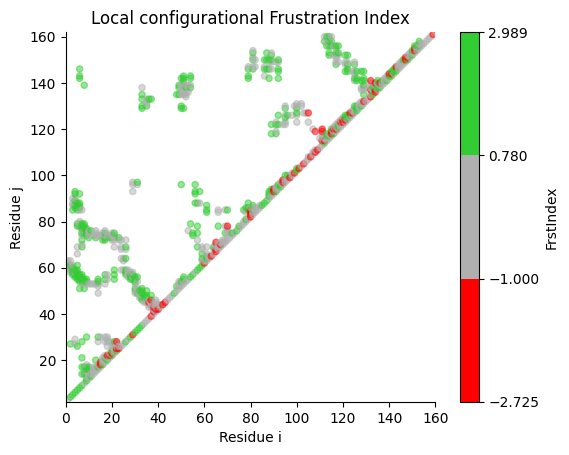

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np

# Función para mapear valores a colores según los rangos especificados
def color_map(value):
    if value > 0.78:
        return '#32CD32'  # Lima
    elif value >= -1:
        return '#B0B0B0'  # Gris claro
    else:
        return 'red'

# Aplicamos la función para obtener los colores
colors = df['FrstIndex'].apply(color_map)

# Configuramos la figura y los ejes para un aspecto cuadrado
fig, ax = plt.subplots()
ax.set_aspect('equal')

# Graficamos los puntos con los colores asignados
scatter = ax.scatter(df['#Res1'], df['Res2'], c=colors, s=20, alpha=.5)

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Ajustamos los límites de los ejes para asegurar un aspecto cuadrado
ax.set_xlim(df['#Res1'].min() - 1, df['#Res1'].max() + 1)
ax.set_ylim(df['Res2'].min() - 1, df['Res2'].max() + 1)

# Etiquetas y título del gráfico
ax.set_xlabel('Residue i')
ax.set_ylabel('Residue j')
ax.set_title('Local configurational Frustration Index')

# Creamos una barra de color personalizada
import matplotlib.colors as mcolors

# Definimos los segmentos de color con degradado
cmap = mcolors.LinearSegmentedColormap.from_list(
    'custom_cmap',
    ['red', '#B0B0B0', '#32CD32']
)
bounds = [df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Añadimos la barra de color al gráfico con degradado
cbar = plt.colorbar(
    plt.cm.ScalarMappable(norm=norm, cmap=cmap),
    ax=ax,
    boundaries=bounds,
    ticks=[df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
)
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()


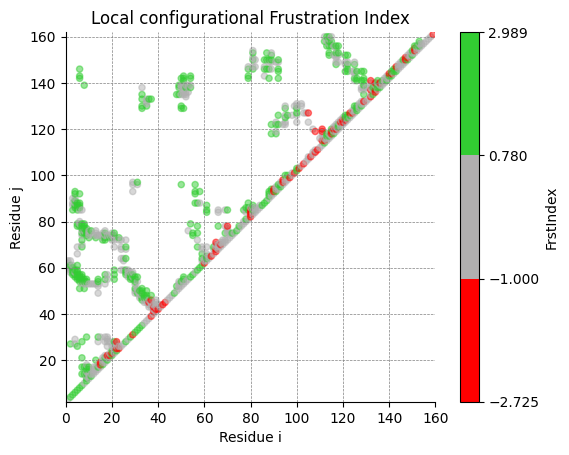

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np

# Función para mapear valores a colores según los rangos especificados
def color_map(value):
    if value > 0.78:
        return '#32CD32'  # Lima
    elif value >= -1:
        return '#B0B0B0'  # Gris claro
    else:
        return 'red'

# Aplicamos la función para obtener los colores
colors = df['FrstIndex'].apply(color_map)

# Configuramos la figura y los ejes para un aspecto cuadrado
fig, ax = plt.subplots()
ax.set_aspect('equal')

# Graficamos los puntos con los colores asignados
scatter = ax.scatter(df['#Res1'], df['Res2'], c=colors, s=20, alpha=.5)

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Ajustamos los límites de los ejes para asegurar un aspecto cuadrado
ax.set_xlim(df['#Res1'].min() - 1, df['#Res1'].max() + 1)
ax.set_ylim(df['Res2'].min() - 1, df['Res2'].max() + 1)

# Añadimos líneas discontinuas internas al gráfico
ax.grid(which='both', linestyle='--', linewidth=0.5, color='gray')

# Etiquetas y título del gráfico
ax.set_xlabel('Residue i')
ax.set_ylabel('Residue j')
ax.set_title('Local configurational Frustration Index')

# Creamos una barra de color personalizada con degradado
import matplotlib.colors as mcolors

# Definimos los segmentos de color con degradado
cmap = mcolors.LinearSegmentedColormap.from_list(
    'custom_cmap',
    ['red', '#B0B0B0', '#32CD32']
)
bounds = [df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Añadimos la barra de color al gráfico con degradado
cbar = plt.colorbar(
    plt.cm.ScalarMappable(norm=norm, cmap=cmap),
    ax=ax,
    boundaries=bounds,
    ticks=[df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
)
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()


# **El siguiente esta pro**

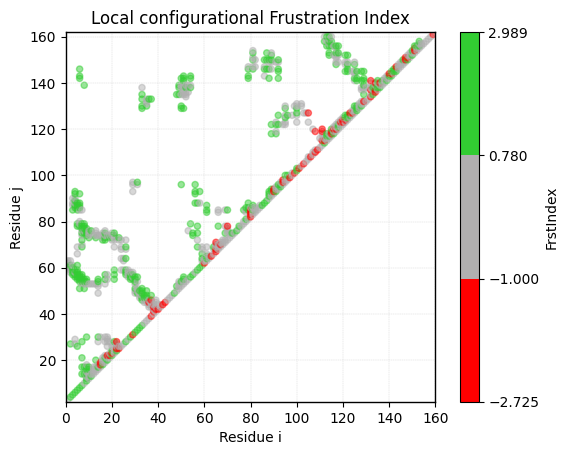

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np

# Función para mapear valores a colores según los rangos especificados
def color_map(value):
    if value > 0.78:
        return '#32CD32'  # Lima
    elif value >= -1:
        return '#B0B0B0'  # Gris claro
    else:
        return 'red'

# Aplicamos la función para obtener los colores
colors = df['FrstIndex'].apply(color_map)

# Configuramos la figura y los ejes para un aspecto cuadrado
fig, ax = plt.subplots()
ax.set_aspect('equal')

# Graficamos los puntos con los colores asignados
scatter = ax.scatter(df['#Res1'], df['Res2'], c=colors, s=20, alpha=.5)

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Ajustamos los límites de los ejes para asegurar un aspecto cuadrado
ax.set_xlim(df['#Res1'].min() - 1, df['#Res1'].max() + 1)
ax.set_ylim(df['Res2'].min() - 1, df['Res2'].max() + 1)

# Añadimos líneas discontinuas internas al gráfico, más tenues
ax.grid(which='both', linestyle='--', linewidth=0.3, color='lightgray')

# Enmarcamos el gráfico
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1)

# Etiquetas y título del gráfico
ax.set_xlabel('Residue i')
ax.set_ylabel('Residue j')
ax.set_title('Local configurational Frustration Index')

# Creamos una barra de color personalizada con degradado
import matplotlib.colors as mcolors

# Definimos los segmentos de color con degradado
cmap = mcolors.LinearSegmentedColormap.from_list(
    'custom_cmap',
    ['red', '#B0B0B0', '#32CD32']
)
bounds = [df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# Añadimos la barra de color al gráfico con degradado
cbar = plt.colorbar(
    plt.cm.ScalarMappable(norm=norm, cmap=cmap),
    ax=ax,
    boundaries=bounds,
    ticks=[df['FrstIndex'].min(), -1, 0.78, df['FrstIndex'].max()]
)
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()



In [ ]:
#craer data frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
#df = pd.read_csv('df.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df = pd.read_csv('namedfB.txt' , sep='\s+', header=None, names=['#Res1','Res2','ChainRes1','ChainRes2','DensityRes1','DensityRes2','AA1','AA2','NativeEnergy','DecoyEnergy','SDEnergy','FrstIndex','Welltype','FrstState'], skiprows=1)
df

,#Res1,Res2,ChainRes1,ChainRes2,DensityRes1,DensityRes2,AA1,AA2,NativeEnergy,DecoyEnergy,SDEnergy,FrstIndex,Welltype,FrstState
0,1,3,A,A,1.000,0.271,M,S,-1.631,-1.399,0.515,0.450,water-mediated,neutral
1,1,60,A,A,1.000,1.469,M,D,-1.213,-1.399,0.515,-0.362,short,neutral
2,1,61,A,A,1.000,0.004,M,P,-1.401,-1.399,0.515,0.003,water-mediated,neutral
3,1,62,A,A,1.000,0.000,M,E,-1.523,-1.399,0.515,0.240,water-mediated,neutral
4,1,63,A,A,1.000,0.000,M,V,-1.641,-1.399,0.515,0.470,water-mediated,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
759,156,161,A,A,1.059,2.048,N,K,-2.381,-1.399,0.515,1.906,water-mediated,minimally
760,157,159,A,A,0.000,2.559,T,F,-1.420,-1.399,0.515,0.040,water-mediated,neutral
761,157,160,A,A,0.000,2.023,T,R,-1.746,-1.399,0.515,0.674,water-mediated,neutral
762,158,160,A,A,0.992,2.023,E,R,-2.862,-1.399,0.515,2.839,water-mediated,minimally


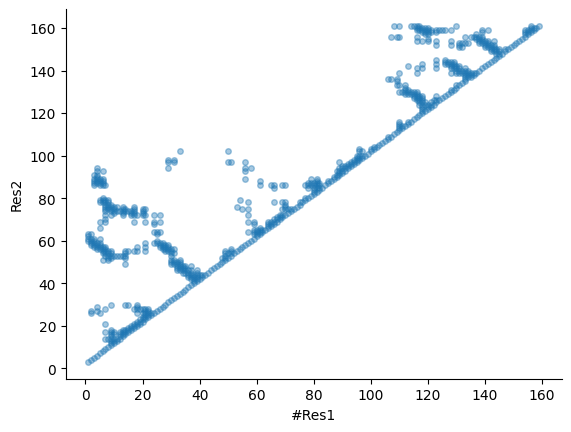

In [ ]:
# @title #Res1 vs Res2

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='#Res1', y='Res2', s=16, alpha=.4)
plt.gca().spines[['top', 'right',]].set_visible(False)

<ipython-input-41-917e52d9d648>:21: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap))


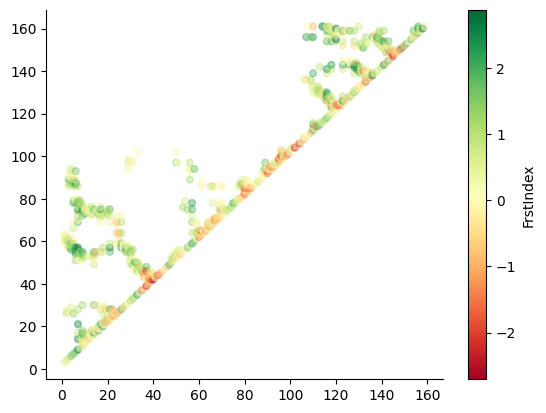

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np

# Normalizamos los valores de 'FrstIndex' al rango [0, 1]
norm = plt.Normalize(df['FrstIndex'].min(), df['FrstIndex'].max())

# Usamos el colormap 'RdYlGn'
cmap = plt.get_cmap('RdYlGn')

# Obtenemos los colores para cada punto
colors = cmap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=24, alpha=.4)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap))
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()

<ipython-input-43-d364d1b11c51>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


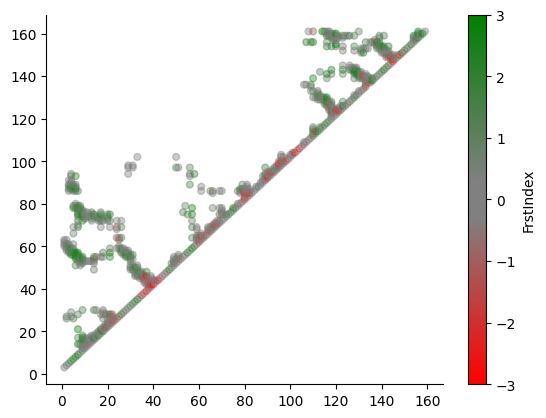

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado
colors = [
    (0, "red"),    # Rojo en -3
    (0.45, "gray"), # Gris en -0.3
    (0.55, "gray"), # Gris en 0.3
    (1, "green")   # Verde en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=24, alpha=.4)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()



<ipython-input-44-246f199f0f81>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


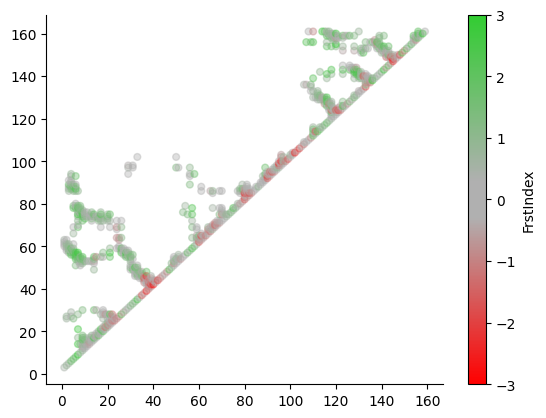

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.45, "#B0B0B0"),  # Gris claro en -0.3
    (0.55, "#B0B0B0"),  # Gris claro en 0.3
    (1, "#32CD32")      # Verde brillante en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=24, alpha=.4)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()


<ipython-input-48-88ac6c2ad4a5>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


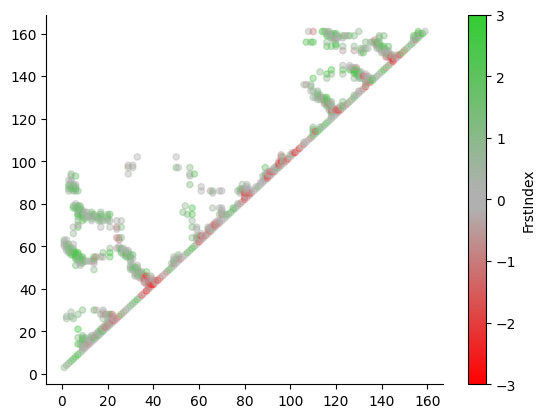

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "#32CD32")      # Verde brillante en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=20, alpha=.4)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()


<ipython-input-53-7f4b7f111da2>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


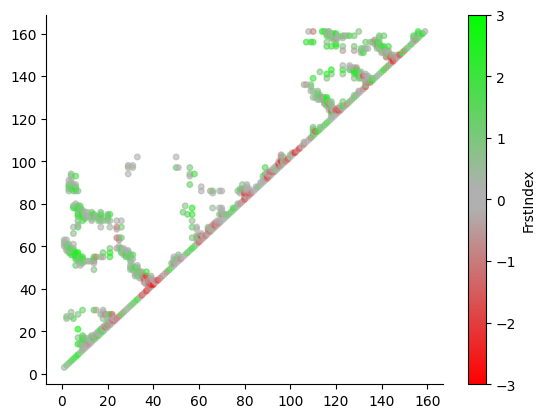

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=16, alpha=.6)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Mostramos el gráfico
plt.show()


<ipython-input-55-133d73876991>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


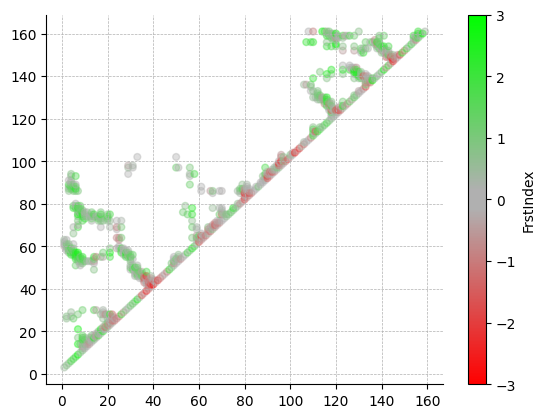

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=24, alpha=.4)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Agregamos líneas punteadas en los ejes
plt.grid(True, linestyle='dashed', linewidth=0.5)

# Mostramos el gráfico
plt.show()





<ipython-input-64-e6bb46f92fe6>:48: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


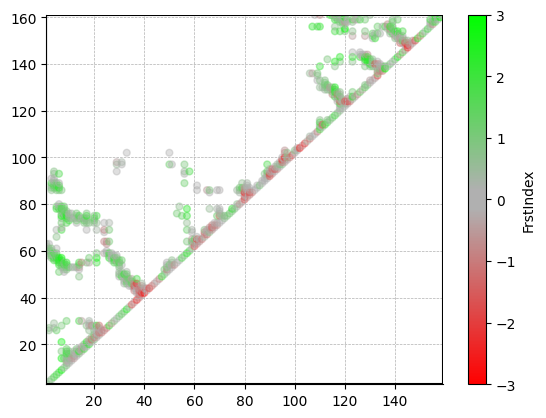

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=24, alpha=.4)

# Ajustamos los límites de los ejes para agregar márgenes
plt.xlim(df['#Res1'].min() - 0.1, df['#Res1'].max() + 0.1)
plt.ylim(df['Res2'].min() - 0.1, df['Res2'].max() + 0.1)

# Agregamos líneas en los bordes del gráfico para cerrar el perímetro
plt.plot([df['#Res1'].min() - 0.1, df['#Res1'].max() + 0.1], [df['Res2'].max() + 0.1, df['Res2'].max() + 0.1], color='black')  # Línea superior

plt.plot([df['#Res1'].min() - 0.1, df['#Res1'].min() - 0.1], [df['Res2'].min() - 0.1, df['Res2'].max() + 0.1], color='black')  # Línea izquierda
plt.plot([df['#Res1'].max() + 0.1, df['#Res1'].max() + 0.1], [df['Res2'].min() - 0.1, df['Res2'].max() + 0.1], color='black')  # Línea derecha
plt.plot([df['#Res1'].min() - 0.1, df['#Res1'].max() + 0.1], [df['Res2'].min() - 0.1, df['Res2'].min() - 0.1], color='black')  # Línea inferior

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Agregamos líneas punteadas en los ejes
plt.grid(True, linestyle='dashed', linewidth=0.5)

# Mostramos el gráfico
plt.show()





<ipython-input-68-f2c1a56a83d7>:43: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


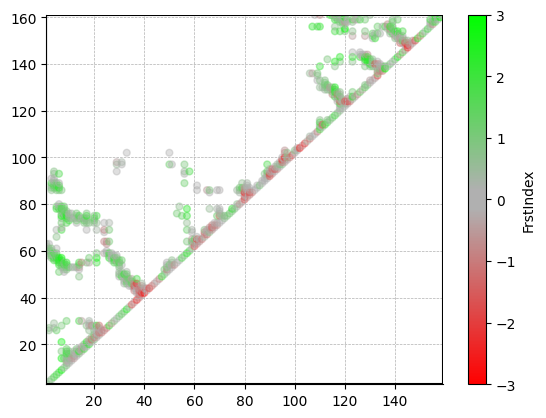

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=24, alpha=.4)

# Ajustamos los límites de los ejes para agregar márgenes
x_margin = 0.1
y_margin = 0.1
plt.xlim(df['#Res1'].min() - x_margin, df['#Res1'].max() + x_margin)
plt.ylim(df['Res2'].min() - y_margin, df['Res2'].max() + y_margin)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Agregamos líneas punteadas en los ejes
plt.grid(True, linestyle='dashed', linewidth=0.5)

# Agregamos líneas en los bordes del gráfico para cerrar el perímetro
plt.plot([df['#Res1'].min() - x_margin, df['#Res1'].max() + x_margin], [df['Res2'].max() + y_margin, df['Res2'].max() + y_margin], color='black')  # Línea superior
plt.plot([df['#Res1'].min() - x_margin, df['#Res1'].min() - x_margin], [df['Res2'].min() - y_margin, df['Res2'].max() + y_margin], color='black')  # Línea izquierda
plt.plot([df['#Res1'].max() + x_margin, df['#Res1'].max() + x_margin], [df['Res2'].min() - y_margin, df['Res2'].max() + y_margin], color='black')  # Línea derecha
plt.plot([df['#Res1'].min() - x_margin, df['#Res1'].max() + x_margin], [df['Res2'].min() - y_margin, df['Res2'].min() - y_margin], color='black')  # Línea inferior

# Mostramos el gráfico
plt.show()



<ipython-input-79-9eac9b7b2f46>:55: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


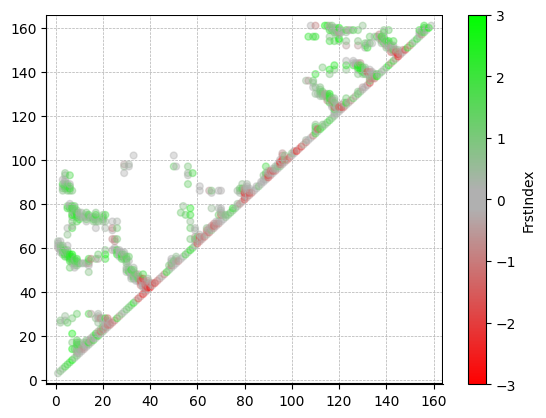

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=24, alpha=.4)

# Obtenemos los límites de los datos
x_min, x_max = df['#Res1'].min(), df['#Res1'].max()
y_min, y_max = df['Res2'].min(), df['Res2'].max()

# Calculamos los valores de cierre para el perímetro externo del gráfico
x_margin = 5
y_margin = 5

# Ajustamos los límites de los ejes para agregar márgenes
plt.xlim(x_min - x_margin, x_max + x_margin)
plt.ylim(y_min - y_margin, y_max + y_margin)

# Agregamos líneas en el perímetro externo del gráfico para cerrarlo
plt.plot([x_min - x_margin, x_max + x_margin], [y_min - y_margin, y_min - y_margin], color='black')  # Línea inferior
plt.plot([x_max + x_margin, x_max + x_margin], [y_min - y_margin, y_max + y_margin], color='black')  # Línea derecha
plt.plot([x_max + x_margin, x_min - x_margin], [y_max + y_margin, y_max + y_margin], color='black')  # Línea superior
plt.plot([x_min - x_margin, x_min - x_margin], [y_max + y_margin, y_min - y_margin], color='black')  # Línea izquierda

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Agregamos líneas punteadas en los ejes
plt.grid(True, linestyle='dashed', linewidth=0.5)

# Mostramos el gráfico
plt.show()








<ipython-input-7-d72d5e9bd491>:55: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))


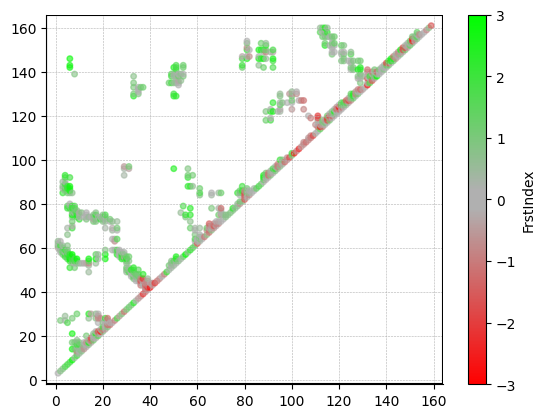

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Tenemos un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no, puede reducirse todo el set de datos 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
plt.scatter(df['#Res1'], df['Res2'], c=colors, s=16, alpha=.6)

# Obtenemos los límites de los datos
x_min, x_max = df['#Res1'].min(), df['#Res1'].max()
y_min, y_max = df['Res2'].min(), df['Res2'].max()

# Calculamos los valores de cierre para el perímetro externo del gráfico
x_margin = 5
y_margin = 5

# Ajustamos los límites de los ejes para agregar márgenes
plt.xlim(x_min - x_margin, x_max + x_margin)
plt.ylim(y_min - y_margin, y_max + y_margin)

# Agregamos líneas en el perímetro externo del gráfico para cerrarlo
plt.plot([x_min - x_margin, x_max + x_margin], [y_min - y_margin, y_min - y_margin], color='black')  # Línea inferior
plt.plot([x_max + x_margin, x_max + x_margin], [y_min - y_margin, y_max + y_margin], color='black')  # Línea derecha
plt.plot([x_max + x_margin, x_min - x_margin], [y_max + y_margin, y_max + y_margin], color='black')  # Línea superior
plt.plot([x_min - x_margin, x_min - x_margin], [y_max + y_margin, y_min - y_margin], color='black')  # Línea izquierda

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap))
cbar.set_label('FrstIndex')

# Agregamos líneas punteadas en los ejes
plt.grid(True, linestyle='dashed', linewidth=0.4)

# Guardamos la figura como una imagen PNG de alta calidad con fondo transparente
plt.savefig('grafico.png', dpi=300, transparent=True)

# Mostramos el gráfico
plt.show()


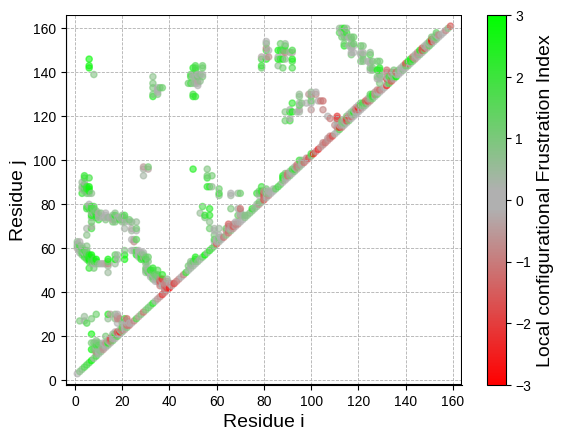

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
fig, ax = plt.subplots()
ax.scatter(df['#Res1'], df['Res2'], c=colors, s=20, alpha=.6)

# Obtenemos los límites de los datos
x_min, x_max = df['#Res1'].min(), df['#Res1'].max()
y_min, y_max = df['Res2'].min(), df['Res2'].max()

# Calculamos los valores de cierre para el perímetro externo del gráfico
x_margin = 5
y_margin = 5

# Ajustamos los límites de los ejes para agregar márgenes
ax.set_xlim(x_min - x_margin, x_max + x_margin)
ax.set_ylim(y_min - y_margin, y_max + y_margin)

# Agregamos líneas en el perímetro externo del gráfico para cerrarlo
ax.plot([x_min - x_margin, x_max + x_margin], [y_min - y_margin, y_min - y_margin], color='black')  # Línea inferior
ax.plot([x_max + x_margin, x_max + x_margin], [y_min - y_margin, y_max + y_margin], color='black')  # Línea derecha
ax.plot([x_max + x_margin, x_min - x_margin], [y_max + y_margin, y_max + y_margin], color='black')  # Línea superior
ax.plot([x_min - x_margin, x_min - x_margin], [y_max + y_margin, y_min - y_margin], color='black')  # Línea izquierda

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap), ax=ax)
cbar.set_label('Local configurational Frustration Index', fontsize=14, fontname='Liberation Sans')


# Agregamos líneas punteadas en los ejes
ax.grid(True, linestyle='dashed', linewidth=0.6)

# Etiquetas y título del gráfico
ax.set_xlabel('Residue i',fontsize=14, fontname='Liberation Sans')
ax.set_ylabel('Residue j',fontsize=14, fontname='Liberation Sans')
#ax.set_title('Contact Map Frustration α-RfaH')

# Guardamos la figura como una imagen PNG de alta calidad con fondo transparente
plt.savefig('contact_map_alfa.png', dpi=600, transparent=True)

# Guardamos la figura como un archivo SVG para alta calidad y escalabilidad
plt.savefig('alfaMap.svg', transparent=True)

# Mostramos el gráfico
plt.show()


In [ ]:
!apt-get install -y fonts-liberation
plt.rcParams['font.family'] = 'Liberation Sans'



Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


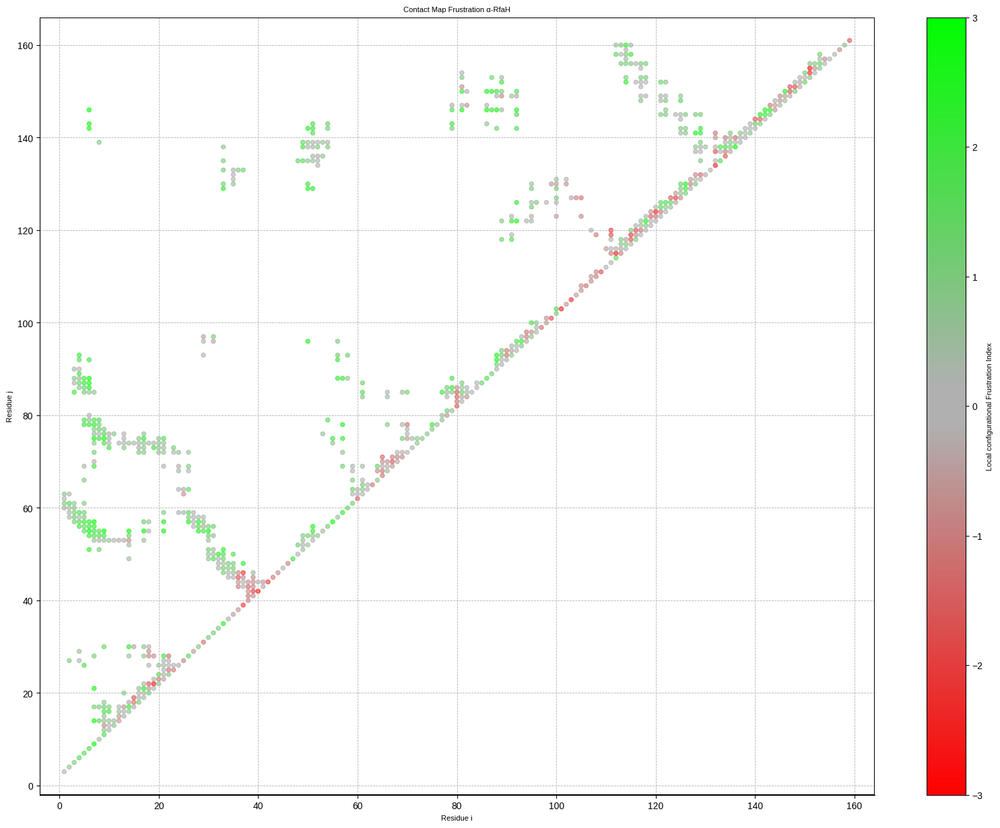

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
fig, ax = plt.subplots(figsize=(20, 15))  # Ajustamos el tamaño de la figura para mayor calidad
ax.scatter(df['#Res1'], df['Res2'], c=colors, s=20, alpha=.6)

# Obtenemos los límites de los datos
x_min, x_max = df['#Res1'].min(), df['#Res1'].max()
y_min, y_max = df['Res2'].min(), df['Res2'].max()

# Calculamos los valores de cierre para el perímetro externo del gráfico
x_margin = 5
y_margin = 5

# Ajustamos los límites de los ejes para agregar márgenes
ax.set_xlim(x_min - x_margin, x_max + x_margin)
ax.set_ylim(y_min - y_margin, y_max + y_margin)

# Agregamos líneas en el perímetro externo del gráfico para cerrarlo
ax.plot([x_min - x_margin, x_max + x_margin], [y_min - y_margin, y_min - y_margin], color='black')  # Línea inferior
ax.plot([x_max + x_margin, x_max + x_margin], [y_min - y_margin, y_max + y_margin], color='black')  # Línea derecha
ax.plot([x_max + x_margin, x_min - x_margin], [y_max + y_margin, y_max + y_margin], color='black')  # Línea superior
ax.plot([x_min - x_margin, x_min - x_margin], [y_max + y_margin, y_min - y_margin], color='black')  # Línea izquierda

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap), ax=ax)
cbar.set_label('Local configurational Frustration Index', fontsize=8, fontname='Liberation Sans')  # Ajustamos el tamaño de la fuente

# Agregamos líneas punteadas en los ejes
ax.grid(True, linestyle='dashed', linewidth=0.6)

# Etiquetas y título del gráfico
ax.set_xlabel('Residue i', fontsize=8, fontname='Liberation Sans')
ax.set_ylabel('Residue j', fontsize=8, fontname='Liberation Sans')
ax.set_title('Contact Map Frustration α-RfaH', fontsize=8, fontname='Liberation Sans')

# Guardamos la figura como una imagen PNG de alta calidad con fondo transparente
plt.savefig('contact_map_alfa.png', dpi=600, transparent=True)

# Guardamos la figura como un archivo SVG para alta calidad y escalabilidad
plt.savefig('alfaMap.svg', transparent=True)

# Mostramos el gráfico
plt.show()


In [ ]:
#craer data frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
#df = pd.read_csv('df.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df = pd.read_csv('/content/drive/MyDrive/Frustra/NativeStates/Beta_pdb_configurational.txt' , sep='\s+', header=None, names=['#Res1','Res2','ChainRes1','ChainRes2','DensityRes1','DensityRes2','AA1','AA2','NativeEnergy','DecoyEnergy','SDEnergy','FrstIndex','Welltype','FrstState'], skiprows=1)
df

,#Res1,Res2,ChainRes1,ChainRes2,DensityRes1,DensityRes2,AA1,AA2,NativeEnergy,DecoyEnergy,SDEnergy,FrstIndex,Welltype,FrstState
0,1,3,A,A,1.000,0.271,M,S,-1.631,-1.399,0.515,0.450,water-mediated,neutral
1,1,60,A,A,1.000,1.469,M,D,-1.213,-1.399,0.515,-0.362,short,neutral
2,1,61,A,A,1.000,0.004,M,P,-1.401,-1.399,0.515,0.003,water-mediated,neutral
3,1,62,A,A,1.000,0.000,M,E,-1.523,-1.399,0.515,0.240,water-mediated,neutral
4,1,63,A,A,1.000,0.000,M,V,-1.641,-1.399,0.515,0.470,water-mediated,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
759,156,161,A,A,1.059,2.048,N,K,-2.381,-1.399,0.515,1.906,water-mediated,minimally
760,157,159,A,A,0.000,2.559,T,F,-1.420,-1.399,0.515,0.040,water-mediated,neutral
761,157,160,A,A,0.000,2.023,T,R,-1.746,-1.399,0.515,0.674,water-mediated,neutral
762,158,160,A,A,0.992,2.023,E,R,-2.862,-1.399,0.515,2.839,water-mediated,minimally


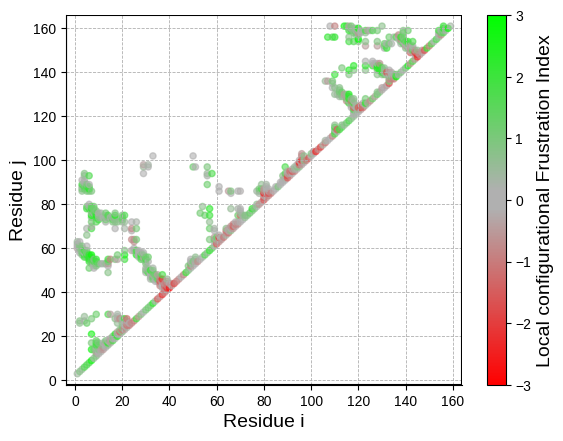

In [ ]:
# Importamos las librerías necesarias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap

# Supongamos que tienes un DataFrame 'df' con las columnas '#Res1', 'Res2' y 'FrstIndex'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     '#Res1': np.random.rand(100),
#     'Res2': np.random.rand(100),
#     'FrstIndex': np.random.rand(100) * 6 - 3  # Valores entre -3 y 3 por ejemplo
# })

# Normalizamos los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definimos el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lime en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Obtenemos los colores para cada punto
colors = mymap(norm(df['FrstIndex']))

# Graficamos los puntos con colores
fig, ax = plt.subplots()
ax.scatter(df['#Res1'], df['Res2'], c=colors, s=20, alpha=.6)

# Obtenemos los límites de los datos
x_min, x_max = df['#Res1'].min(), df['#Res1'].max()
y_min, y_max = df['Res2'].min(), df['Res2'].max()

# Calculamos los valores de cierre para el perímetro externo del gráfico
x_margin = 5
y_margin = 5

# Ajustamos los límites de los ejes para agregar márgenes
ax.set_xlim(x_min - x_margin, x_max + x_margin)
ax.set_ylim(y_min - y_margin, y_max + y_margin)

# Agregamos líneas en el perímetro externo del gráfico para cerrarlo
ax.plot([x_min - x_margin, x_max + x_margin], [y_min - y_margin, y_min - y_margin], color='black')  # Línea inferior
ax.plot([x_max + x_margin, x_max + x_margin], [y_min - y_margin, y_max + y_margin], color='black')  # Línea derecha
ax.plot([x_max + x_margin, x_min - x_margin], [y_max + y_margin, y_max + y_margin], color='black')  # Línea superior
ax.plot([x_min - x_margin, x_min - x_margin], [y_max + y_margin, y_min - y_margin], color='black')  # Línea izquierda

# Ocultamos las espinas superior y derecha del gráfico
ax.spines[['top', 'right']].set_visible(False)

# Agregamos una barra de color para mostrar la escala de 'FrstIndex'
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=mymap), ax=ax)
cbar.set_label('Local configurational Frustration Index', fontsize=14, fontname='Liberation Sans')


# Agregamos líneas punteadas en los ejes
ax.grid(True, linestyle='dashed', linewidth=0.6)

# Etiquetas y título del gráfico
ax.set_xlabel('Residue i',fontsize=14, fontname='Liberation Sans')
ax.set_ylabel('Residue j',fontsize=14, fontname='Liberation Sans')
#ax.set_title('Contact Map Frustration α-RfaH')

# Guardamos la figura como una imagen PNG de alta calidad con fondo transparente
plt.savefig('contact_map_beta.png', dpi=600, transparent=True)

# Guardamos la figura como un archivo SVG para alta calidad y escalabilidad
plt.savefig('BetaMap.svg', transparent=True)

# Mostramos el gráfico
plt.show()

# Otros graficos utiles

## Matplotlib

[Matplotlib](http://matplotlib.org/) es el paquete de gráficos más común, vea su [documentación](http://matplotlib.org/api/pyplot_api.html) para más detalles, y sus [ejemplos](http://matplotlib.org/gallery.html#statistics) parra que te den ideas.

### Line Plots
Gráficos de línea de puntos

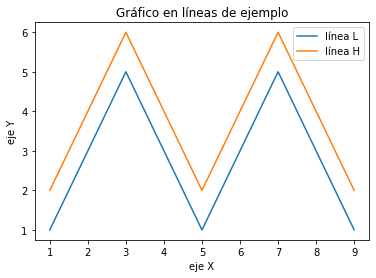

In [ ]:
import matplotlib.pyplot as plt

x  = [1, 2, 3, 4, 5, 6, 7, 8, 9]
y1 = [1, 3, 5, 3, 1, 3, 5, 3, 1]
y2 = [2, 4, 6, 4, 2, 4, 6, 4, 2]
plt.plot(x, y1, label="línea L")
plt.plot(x, y2, label="línea H")
plt.plot()

plt.xlabel("eje X")
plt.ylabel("eje Y")
plt.title("Gráfico en líneas de ejemplo")
plt.legend()
plt.show()

### Bar Plots
Gráfico de barras

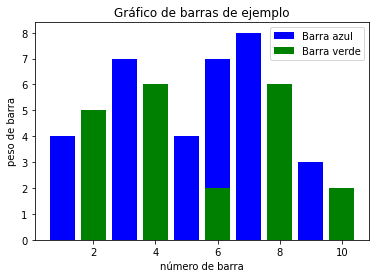

In [ ]:
import matplotlib.pyplot as plt

# Mira el índice 4 y  5, muestra casos superpuestos.
x1 = [1, 3, 4, 5, 6, 7, 9]
y1 = [4, 7, 2, 4, 7, 8, 3]

x2 = [2, 4, 6, 8, 10]
y2 = [5, 6, 2, 6, 2]

# Colores: https://matplotlib.org/api/colors_api.html

plt.bar(x1, y1, label="Barra azul", color='b')
plt.bar(x2, y2, label="Barra verde", color='g')
plt.plot()

plt.xlabel("número de barra")
plt.ylabel("peso de barra")
plt.title("Gráfico de barras de ejemplo")
plt.legend()
plt.show()

### Histogramas
Histogramas de frecuencia

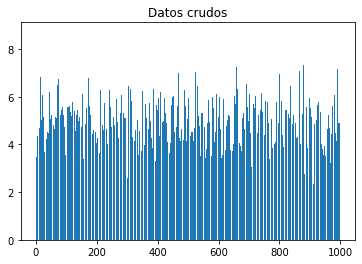

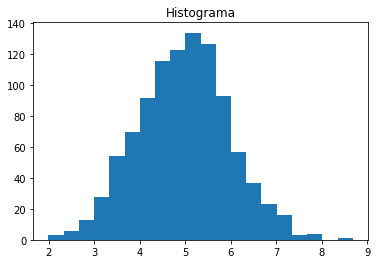

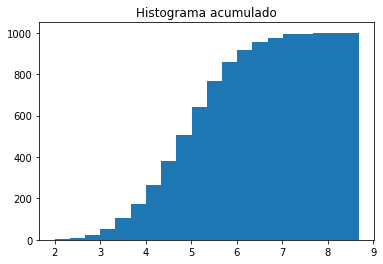

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Se usa numpy para genera un montón de datos al azar en una curva de campaña alrededor de 5.
n = 5 + np.random.randn(1000)

m = [m for m in range(len(n))]
plt.bar(m, n)
plt.title("Datos crudos")
plt.show()

plt.hist(n, bins=20)
plt.title("Histograma")
plt.show()

plt.hist(n, cumulative=True, bins=20)
plt.title("Histograma acumulado")
plt.show()

### Gráfico de dispersión (Scatter Plots)

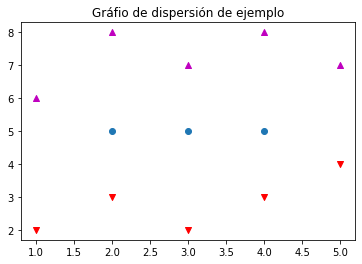

In [ ]:
import matplotlib.pyplot as plt

x1 = [2, 3, 4]
y1 = [5, 5, 5]

x2 = [1, 2, 3, 4, 5]
y2 = [2, 3, 2, 3, 4]
y3 = [6, 8, 7, 8, 7]

# Markers: https://matplotlib.org/api/markers_api.html

plt.scatter(x1, y1)
plt.scatter(x2, y2, marker='v', color='r')
plt.scatter(x2, y3, marker='^', color='m')
plt.title('Gráfio de dispersión de ejemplo')
plt.show()

### Stack Plots

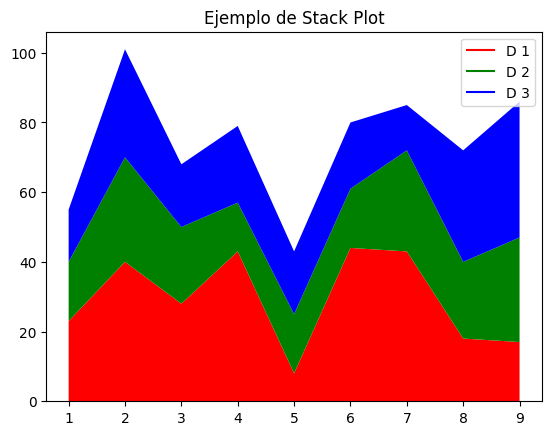

In [ ]:
import matplotlib.pyplot as plt

idxes = [ 1,  2,  3,  4,  5,  6,  7,  8,  9]
arr1  = [23, 40, 28, 43,  8, 44, 43, 18, 17]
arr2  = [17, 30, 22, 14, 17, 17, 29, 22, 30]
arr3  = [15, 31, 18, 22, 18, 19, 13, 32, 39]

# Añadir una leyenda a los stack plots es complicado.
plt.plot([], [], color='red', label = 'D 1')
plt.plot([], [], color='g', label = 'D 2')
plt.plot([], [], color='b', label = 'D 3')

plt.stackplot(idxes, arr1, arr2, arr3, colors= ['r', 'g', 'b'])
plt.title('Ejemplo de Stack Plot')
plt.legend()
plt.show()

### Gráficos circulares (Pie Charts)

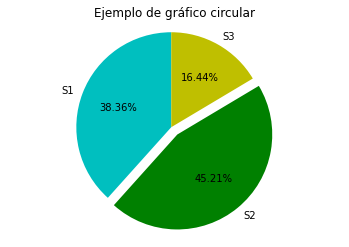

In [ ]:
import matplotlib.pyplot as plt

labels = 'S1', 'S2', 'S3'
sections = [56, 66, 24]
colors = ['c', 'g', 'y']

plt.pie(sections, labels=labels, colors=colors,
        startangle=90,
        explode = (0, 0.1, 0),
        autopct = '%1.2f%%')

plt.axis('equal') #
plt.title('Ejemplo de gráfico circular')
plt.show()

### fill_between y alpha

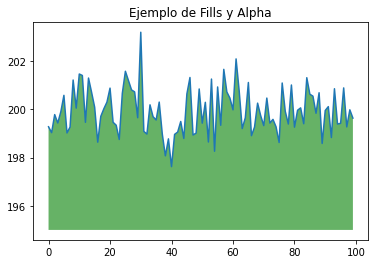

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

ys = 200 + np.random.randn(100)
x = [x for x in range(len(ys))]

plt.plot(x, ys, '-')
plt.fill_between(x, ys, 195, where=(ys > 195), facecolor='g', alpha=0.6)

plt.title("Ejemplo de Fills y Alpha")
plt.show()

red        # Rojo en -3
"#B0B0B0"), # Gris claro en -0.15
(green, "lime")

In [ ]:
#craer data frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
#df = pd.read_csv('df.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df = pd.read_csv('/content/Dynamic_plots_res_50_X/configurational_Res_50_X' , sep='\s+', header=None, names=['Res', 'ChainRes', 'Total', 'nHighlyFrst', 'nNeutrallyFrst', 'nMinimallyFrst', 'relHighlyFrustrated', 'relNeutralFrustrated', 'relMinimallyFrustrated'], skiprows=1)
df

,Res,ChainRes,Total,nHighlyFrst,nNeutrallyFrst,nMinimallyFrst,relHighlyFrustrated,relNeutralFrustrated,relMinimallyFrustrated
0,50,X,31,0,10,21,0.000000,0.322581,0.677419
1,50,X,29,0,14,15,0.000000,0.482759,0.517241
2,50,X,30,0,19,11,0.000000,0.633333,0.366667
3,50,X,31,0,11,20,0.000000,0.354839,0.645161
4,50,X,33,0,14,19,0.000000,0.424242,0.575758
...,...,...,...,...,...,...,...,...,...
11990,50,X,42,0,22,20,0.000000,0.523810,0.476190
11991,50,X,37,0,12,25,0.000000,0.324324,0.675676
11992,50,X,37,0,15,22,0.000000,0.405405,0.594595
11993,50,X,42,0,24,18,0.000000,0.571429,0.428571


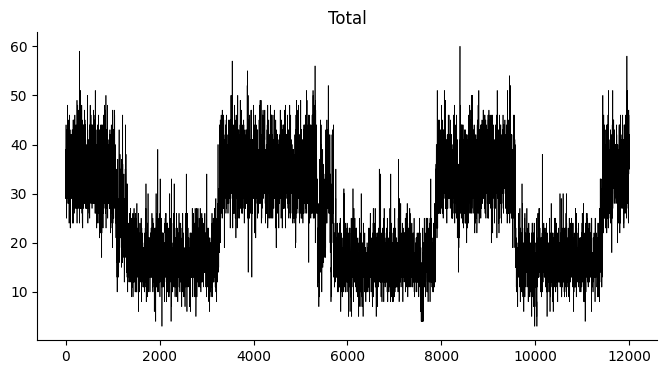

In [ ]:
# @title Total

from matplotlib import pyplot as plt
import pandas as pd

# Graficamos 'Total' con líneas de color negro
df['Total'].plot(kind='line', figsize=(8, 4), title='Total', color='black', linewidth=0.5)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Mostramos el gráfico
plt.show()

In [ ]:
#craer data frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
#df = pd.read_csv('df.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df = pd.read_csv('/content/Dynamic_plots_res_50_X/configurational_Res_50_X' , sep='\s+', header=None, names=['Res', 'ChainRes', 'Total', 'nHighlyFrst', 'nNeutrallyFrst', 'nMinimallyFrst', 'relHighlyFrustrated', 'relNeutralFrustrated', 'relMinimallyFrustrated'], skiprows=1)
df

,Res,ChainRes,Total,nHighlyFrst,nNeutrallyFrst,nMinimallyFrst,relHighlyFrustrated,relNeutralFrustrated,relMinimallyFrustrated
0,50,X,31,0,10,21,0.000000,0.322581,0.677419
1,50,X,29,0,14,15,0.000000,0.482759,0.517241
2,50,X,30,0,19,11,0.000000,0.633333,0.366667
3,50,X,31,0,11,20,0.000000,0.354839,0.645161
4,50,X,33,0,14,19,0.000000,0.424242,0.575758
...,...,...,...,...,...,...,...,...,...
11990,50,X,42,0,22,20,0.000000,0.523810,0.476190
11991,50,X,37,0,12,25,0.000000,0.324324,0.675676
11992,50,X,37,0,15,22,0.000000,0.405405,0.594595
11993,50,X,42,0,24,18,0.000000,0.571429,0.428571


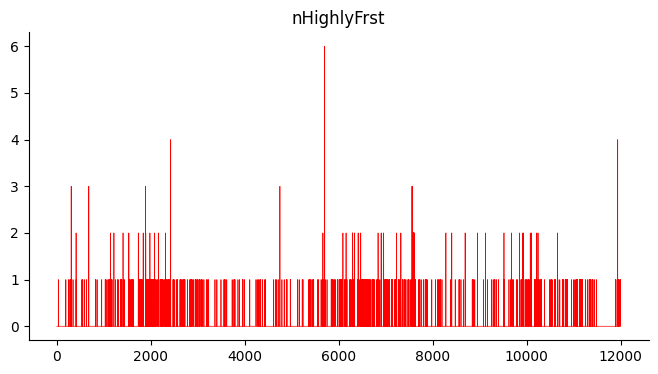

In [ ]:
# @title nHighlyFrst

from matplotlib import pyplot as plt
import pandas as pd

# Graficamos 'Total' con líneas de color negro
df['nHighlyFrst'].plot(kind='line', figsize=(8, 4), title='nHighlyFrst', color='red', linewidth=0.5)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Mostramos el gráfico
plt.show()

In [ ]:
#craer data frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
#df = pd.read_csv('df.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df = pd.read_csv('/content/Dynamic_plots_res_50_X/configurational_Res_50_X' , sep='\s+', header=None, names=['Res', 'ChainRes', 'Total', 'nHighlyFrst', 'nNeutrallyFrst', 'nMinimallyFrst', 'relHighlyFrustrated', 'relNeutralFrustrated', 'relMinimallyFrustrated'], skiprows=1)
df

,Res,ChainRes,Total,nHighlyFrst,nNeutrallyFrst,nMinimallyFrst,relHighlyFrustrated,relNeutralFrustrated,relMinimallyFrustrated
0,50,X,31,0,10,21,0.000000,0.322581,0.677419
1,50,X,29,0,14,15,0.000000,0.482759,0.517241
2,50,X,30,0,19,11,0.000000,0.633333,0.366667
3,50,X,31,0,11,20,0.000000,0.354839,0.645161
4,50,X,33,0,14,19,0.000000,0.424242,0.575758
...,...,...,...,...,...,...,...,...,...
11990,50,X,42,0,22,20,0.000000,0.523810,0.476190
11991,50,X,37,0,12,25,0.000000,0.324324,0.675676
11992,50,X,37,0,15,22,0.000000,0.405405,0.594595
11993,50,X,42,0,24,18,0.000000,0.571429,0.428571


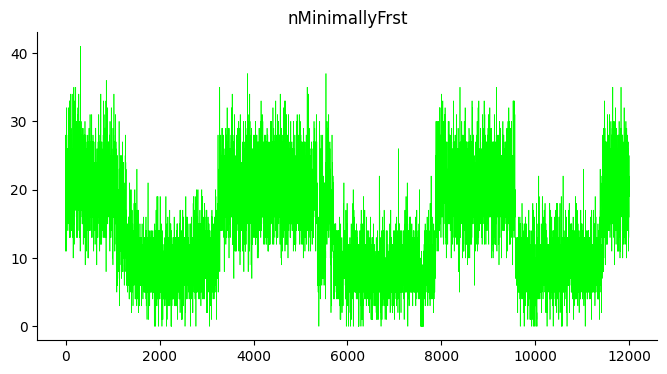

In [ ]:
# @title nMinimallyFrst

from matplotlib import pyplot as plt
import pandas as pd

# Graficamos 'Total' con líneas de color negro
df['nMinimallyFrst'].plot(kind='line', figsize=(8, 4), title='nMinimallyFrst', color='lime', linewidth=0.5)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Mostramos el gráfico
plt.show()

In [ ]:
#craer data frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
#df = pd.read_csv('df.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df = pd.read_csv('/content/Dynamic_plots_res_50_X/configurational_Res_50_X' , sep='\s+', header=None, names=['Res', 'ChainRes', 'Total', 'nHighlyFrst', 'nNeutrallyFrst', 'nMinimallyFrst', 'relHighlyFrustrated', 'relNeutralFrustrated', 'relMinimallyFrustrated'], skiprows=1)
df

,Res,ChainRes,Total,nHighlyFrst,nNeutrallyFrst,nMinimallyFrst,relHighlyFrustrated,relNeutralFrustrated,relMinimallyFrustrated
0,50,X,31,0,10,21,0.000000,0.322581,0.677419
1,50,X,29,0,14,15,0.000000,0.482759,0.517241
2,50,X,30,0,19,11,0.000000,0.633333,0.366667
3,50,X,31,0,11,20,0.000000,0.354839,0.645161
4,50,X,33,0,14,19,0.000000,0.424242,0.575758
...,...,...,...,...,...,...,...,...,...
11990,50,X,42,0,22,20,0.000000,0.523810,0.476190
11991,50,X,37,0,12,25,0.000000,0.324324,0.675676
11992,50,X,37,0,15,22,0.000000,0.405405,0.594595
11993,50,X,42,0,24,18,0.000000,0.571429,0.428571


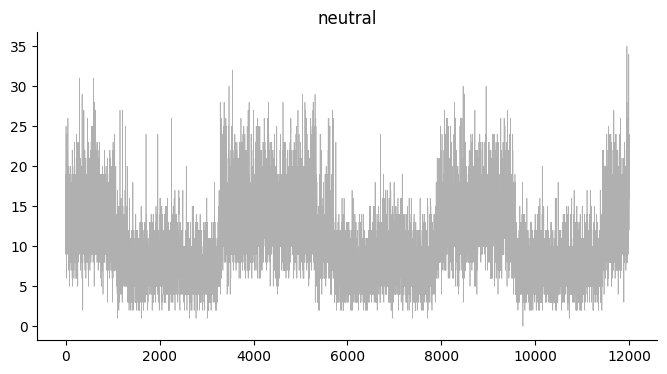

In [ ]:
# @title nNeutrallyFrst

from matplotlib import pyplot as plt
import pandas as pd

# Graficamos 'Total' con líneas de color negro
df['nNeutrallyFrst'].plot(kind='line', figsize=(8, 4), title='neutral', color='#B0B0B0', linewidth=0.5)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Mostramos el gráfico
plt.show()

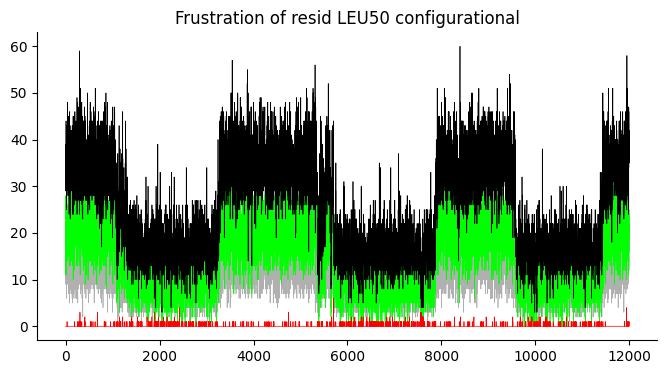

In [ ]:
# @title nNeutrallyFrst

from matplotlib import pyplot as plt
import pandas as pd

# Graficamos 'Total' con líneas de color negro
df['nNeutrallyFrst'].plot(kind='line', figsize=(8, 4), title='Frustration of resid LEU50 configurational', color='#B0B0B0', linewidth=0.5)
df['nMinimallyFrst'].plot(kind='line', figsize=(8, 4), color='lime', linewidth=0.5)
df['nHighlyFrst'].plot(kind='line', figsize=(8, 4), color='red', linewidth=0.5)
df['Total'].plot(kind='line', figsize=(8, 4), color='black', linewidth=0.5)

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Mostramos el gráfico
plt.show()

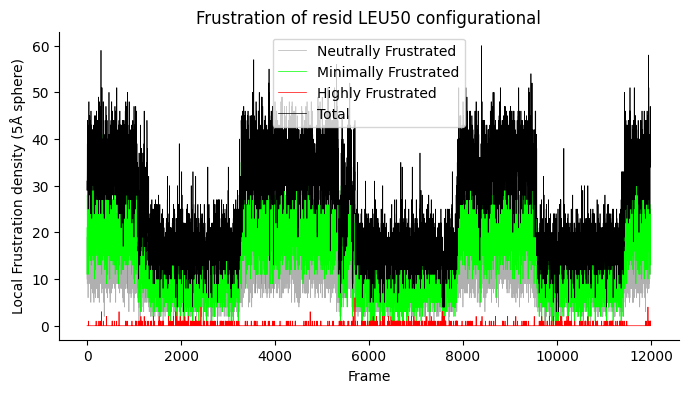

In [ ]:

from matplotlib import pyplot as plt
import pandas as pd

# Supongamos que tienes un DataFrame 'df' con las columnas 'nNeutrallyFrst', 'nMinimallyFrst', 'nHighlyFrst', y 'Total'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:
# df = pd.DataFrame({
#     'nNeutrallyFrst': np.random.rand(100),
#     'nMinimallyFrst': np.random.rand(100),
#     'nHighlyFrst': np.random.rand(100),
#     'Total': np.random.rand(100)
# })

# Graficamos 'Total' con líneas de color negro y más delgadas
plt.figure(figsize=(8, 4))
plt.plot(df['nNeutrallyFrst'], label='Neutrally Frustrated', color='#B0B0B0', linewidth=0.5)
plt.plot(df['nMinimallyFrst'], label='Minimally Frustrated', color='lime', linewidth=0.5)
plt.plot(df['nHighlyFrst'], label='Highly Frustrated', color='red', linewidth=0.5)
plt.plot(df['Total'], label='Total', color='black', linewidth=0.5)

# Agregamos título y etiquetas de los ejes
plt.title('Frustration of resid LEU50 configurational')
plt.xlabel('Frame')
plt.ylabel('Local Frustration density (5Å sphere)')

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una leyenda
plt.legend()

# Mostramos el gráfico
plt.show()


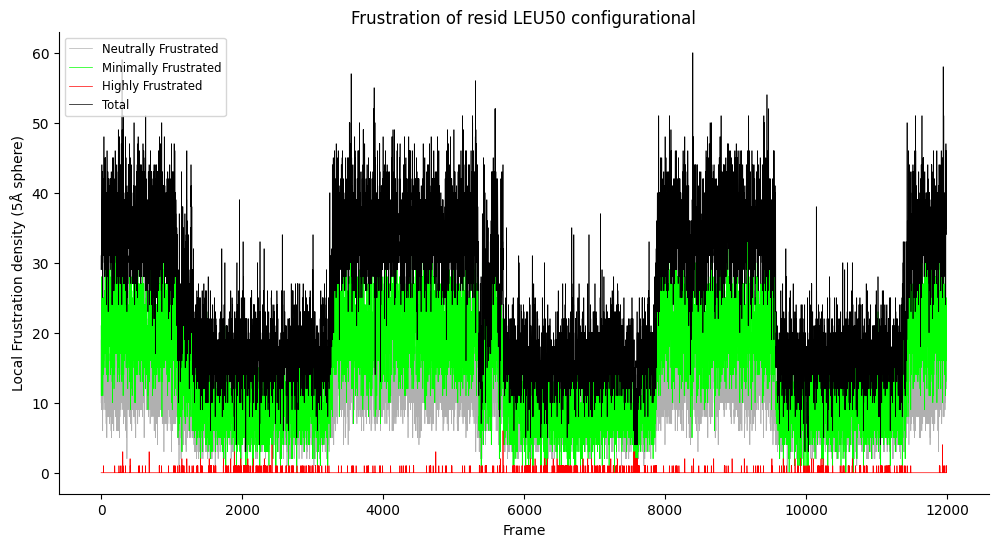

In [ ]:


from matplotlib import pyplot as plt
import pandas as pd
import numpy as np


# Graficamos 'Total' con líneas de color negro y más delgadas
plt.figure(figsize=(12, 6))
plt.plot(df['nNeutrallyFrst'], label='Neutrally Frustrated', color='#B0B0B0', linewidth=0.5)
plt.plot(df['nMinimallyFrst'], label='Minimally Frustrated', color='lime', linewidth=0.5)
plt.plot(df['nHighlyFrst'], label='Highly Frustrated', color='red', linewidth=0.5)
plt.plot(df['Total'], label='Total', color='black', linewidth=0.5)

# Agregamos título y etiquetas de los ejes
plt.title('Frustration of resid LEU50 configurational')
plt.xlabel('Frame')
plt.ylabel('Local Frustration density (5Å sphere)')

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregamos una leyenda con un tamaño de fuente más pequeño
plt.legend(fontsize='small')

# Guardamos la figura en alta calidad con fondo transparente
plt.savefig('frustration_plot.png', dpi=600, transparent=True)

# Mostramos el gráfico
plt.show()


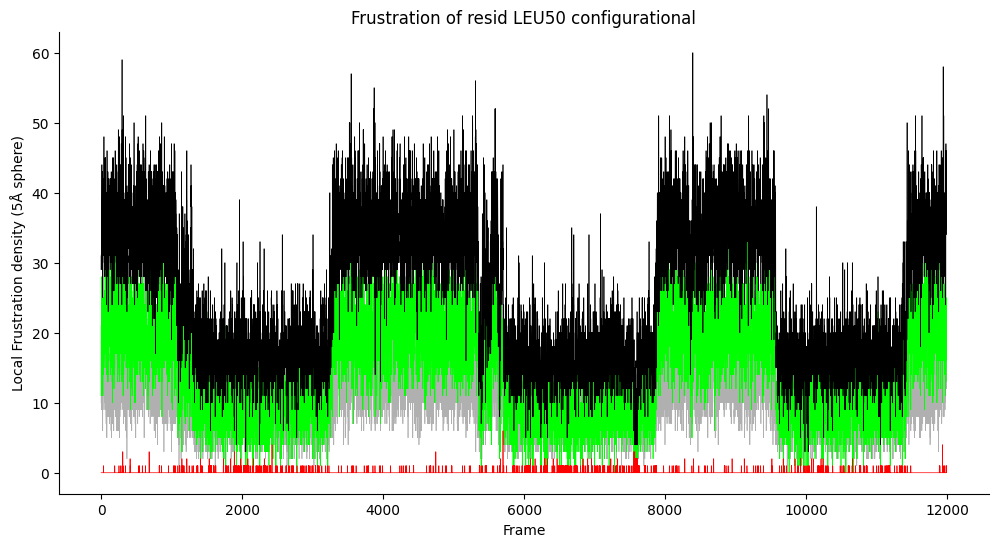

In [ ]:
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np

# Supongamos que tienes un DataFrame 'df' con las columnas 'nNeutrallyFrst', 'nMinimallyFrst', 'nHighlyFrst', y 'Total'
# Si no tienes 'df' definido, puedes definirlo con datos de ejemplo:

# Graficamos 'Total' con líneas de color negro y más delgadas
plt.figure(figsize=(12, 6))
plt.plot(df['nNeutrallyFrst'], label='Neutrally Frustrated', color='#B0B0B0', linewidth=0.5)
plt.plot(df['nMinimallyFrst'], label='Minimally Frustrated', color='lime', linewidth=0.5)
plt.plot(df['nHighlyFrst'], label='Highly Frustrated', color='red', linewidth=0.5)
plt.plot(df['Total'], label='Total', color='black', linewidth=0.5)

# Agregamos título y etiquetas de los ejes
plt.title('Frustration of resid LEU50 configurational')
plt.xlabel('Frame')
plt.ylabel('Local Frustration density (5Å sphere)')

# Ocultamos las espinas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Guardamos la figura en alta calidad con fondo transparente
plt.savefig('frustration_plot.png', dpi=600, transparent=True)

# Mostramos el gráfico
plt.show()


### Sub trazado utilizando Subplot2grid

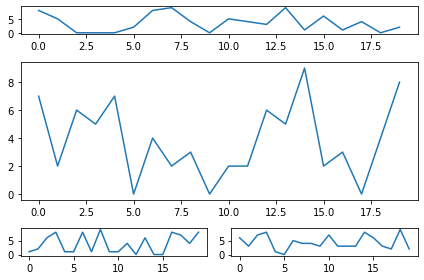

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def random_plots():
  xs = []
  ys = []

  for i in range(20):
    x = i
    y = np.random.randint(10)

    xs.append(x)
    ys.append(y)

  return xs, ys

fig = plt.figure()
ax1 = plt.subplot2grid((5, 2), (0, 0), rowspan=1, colspan=2)
ax2 = plt.subplot2grid((5, 2), (1, 0), rowspan=3, colspan=2)
ax3 = plt.subplot2grid((5, 2), (4, 0), rowspan=1, colspan=1)
ax4 = plt.subplot2grid((5, 2), (4, 1), rowspan=1, colspan=1)

x, y = random_plots()
ax1.plot(x, y)

x, y = random_plots()
ax2.plot(x, y)

x, y = random_plots()
ax3.plot(x, y)

x, y = random_plots()
ax4.plot(x, y)

plt.tight_layout()
plt.show()

## Plot styles

Colaboratory charts use [Seaborn's](https://seaborn.pydata.org) custom styling by default. To customize styling further please see the [matplotlib docs](https://matplotlib.org/users/style_sheets.html).

## 3D Graphs

### 3D Scatter Plots

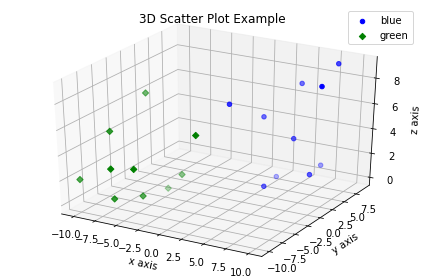

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import axes3d

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x1 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
y1 = np.random.randint(10, size=10)
z1 = np.random.randint(10, size=10)

x2 = [-1, -2, -3, -4, -5, -6, -7, -8, -9, -10]
y2 = np.random.randint(-10, 0, size=10)
z2 = np.random.randint(10, size=10)

ax.scatter(x1, y1, z1, c='b', marker='o', label='blue')
ax.scatter(x2, y2, z2, c='g', marker='D', label='green')

ax.set_xlabel('x axis')
ax.set_ylabel('y axis')
ax.set_zlabel('z axis')
plt.title("3D Scatter Plot Example")
plt.legend()
plt.tight_layout()
plt.show()

### 3D Bar Plots

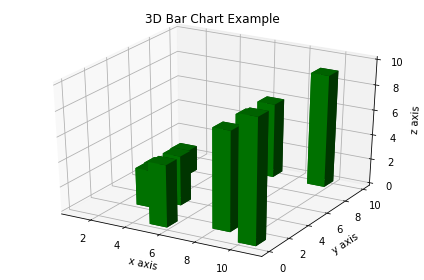

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
y = np.random.randint(10, size=10)
z = np.zeros(10)

dx = np.ones(10)
dy = np.ones(10)
dz = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

ax.bar3d(x, y, z, dx, dy, dz, color='g')

ax.set_xlabel('x axis')
ax.set_ylabel('y axis')
ax.set_zlabel('z axis')
plt.title("3D Bar Chart Example")
plt.tight_layout()
plt.show()

### Wireframe Plots

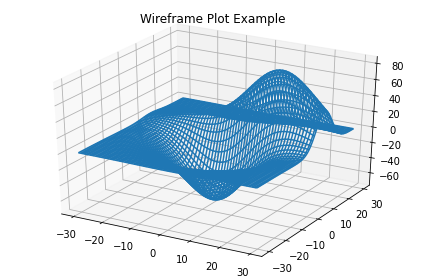

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x, y, z = axes3d.get_test_data()

ax.plot_wireframe(x, y, z, rstride = 2, cstride = 2)

plt.title("Wireframe Plot Example")
plt.tight_layout()
plt.show()

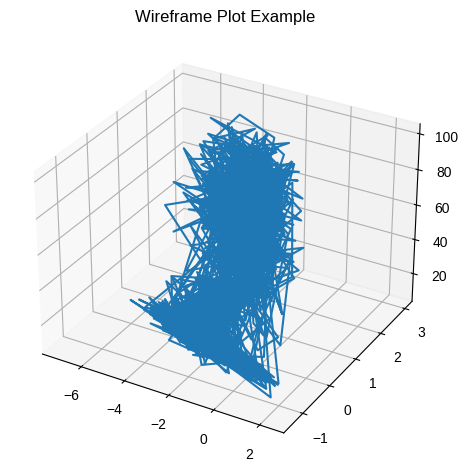

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

# Supongamos que 'df' es tu DataFrame y contiene las columnas 'Native Energy', 'FrstIndex', y 'Model'
# Asegúrate de que estos valores tengan la misma longitud y estén organizados de manera que puedas formar la malla

X = df['Native Energy'].values
Y = df['FrstIndex'].values
Z = df['Distance'].values

# Find the nearest perfect square less than the length of your arrays
n = int(np.floor(np.sqrt(len(X))))

# Trim the arrays to the nearest perfect square length
X = X[:n*n]
Y = Y[:n*n]
Z = Z[:n*n]

# Reshape the arrays to form a square grid
X = X.reshape((n, n))
Y = Y.reshape((n, n))
Z = Z.reshape((n, n))

# Crear una figura y un eje 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Crear el gráfico de wireframe
ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)

# Configurar el título
plt.title("Wireframe Plot Example")

# Ajustar el diseño de la figura
plt.tight_layout()

# Mostrar el gráfico
plt.show()




## Seaborn

There are several libraries layered on top of Matplotlib that you can use in Colab. One that is worth highlighting is [Seaborn](http://seaborn.pydata.org):

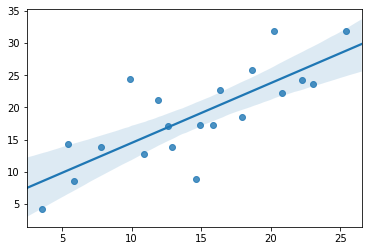

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Generate some random data
num_points = 20
# x will be 5, 6, 7... but also twiddled randomly
x = 5 + np.arange(num_points) + np.random.randn(num_points)
# y will be 10, 11, 12... but twiddled even more randomly
y = 10 + np.arange(num_points) + 5 * np.random.randn(num_points)
sns.regplot(x, y)
plt.show()

That's a simple scatterplot with a nice regression line fit to it, all with just one call to Seaborn's [regplot](http://seaborn.pydata.org/generated/seaborn.regplot.html#seaborn.regplot).

Here's a Seaborn [heatmap](https://seaborn.pydata.org/generated/seaborn.heatmap.html):

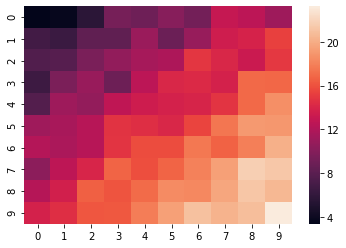

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Make a 10 x 10 heatmap of some random data
side_length = 10
# Start with a 10 x 10 matrix with values randomized around 5
data = 5 + np.random.randn(side_length, side_length)
# The next two lines make the values larger as we get closer to (9, 9)
data += np.arange(side_length)
data += np.reshape(np.arange(side_length), (side_length, 1))
# Generate the heatmap
sns.heatmap(data)
plt.show()

## Altair

[Altair](http://altair-viz.github.io) is a declarative visualization library for creating interactive visualizations in Python, and is installed and enabled in Colab by default.

For example, here is an interactive scatter plot:

In [ ]:
import altair as alt
from vega_datasets import data
cars = data.cars()

alt.Chart(cars).mark_point().encode(
    x='Horsepower',
    y='Miles_per_Gallon',
    color='Origin',
).interactive()

alt.Chart(...)

For more examples of Altair plots, see the [Altair snippets notebook](/notebooks/snippets/altair.ipynb) or the external [Altair Example Gallery](https://altair-viz.github.io/gallery/).

## Plotly

### Sample

In [ ]:
from plotly.offline import iplot
import plotly.graph_objs as go

data = [
    go.Contour(
        z=[[10, 10.625, 12.5, 15.625, 20],
           [5.625, 6.25, 8.125, 11.25, 15.625],
           [2.5, 3.125, 5., 8.125, 12.5],
           [0.625, 1.25, 3.125, 6.25, 10.625],
           [0, 0.625, 2.5, 5.625, 10]]
    )
]
iplot(data)

In [ ]:
#craerdata frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
#df = pd.read_csv('df.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df = pd.read_csv('/content/Dynamic_plots_res_138_X/singleresidue_Res_138_X' , sep='\s+', header=None, names=['Res', 'ChainRes', 'DensityRes', 'AA', 'NativeEnergy', 'DecoyEnergy', 'SDEnergy', 'FrstIndex'], skiprows=1)
df

,Res,ChainRes,DensityRes,AA,NativeEnergy,DecoyEnergy,SDEnergy,FrstIndex
0,138,X,1.953,R,-4.200,-4.288,3.227,-0.027
1,138,X,1.998,R,-2.623,-3.315,3.017,-0.229
2,138,X,1.998,R,-1.050,-2.364,3.094,-0.425
3,138,X,1.748,R,-4.045,-3.622,2.887,0.146
4,138,X,2.028,R,-2.962,-3.001,2.218,-0.018
...,...,...,...,...,...,...,...,...
11990,138,X,1.282,R,-4.326,-4.000,2.689,0.121
11991,138,X,1.369,R,-4.322,-4.363,2.764,-0.015
11992,138,X,1.794,R,-4.291,-4.212,2.730,0.029
11993,138,X,1.747,R,-3.136,-3.392,2.936,-0.087


In [ ]:
import plotly.express as px
!apt-get install -y fonts-liberation
plt.rcParams['font.family'] = 'Liberation Sans'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define a Plotly compatible colorscale based on your Matplotlib colors
colorscale = [
    [0, 'red'],
    [0.45, '#B0B0B0'],
    [0.55, '#B0B0B0'],
    [1, 'lime']
]

# Create a 3D scatter plot with Plotly Express
fig = px.scatter_3d(df, x=df['Model'], z=df['FrstIndex'], y=df['Native Energy'],
                    color='FrstIndex', color_continuous_scale=colorscale, # Use the Plotly colorscale
                    title='3D Scatter Plot of Native Energy, FrstIndex, and Model')

# Show the plot
fig.show()

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


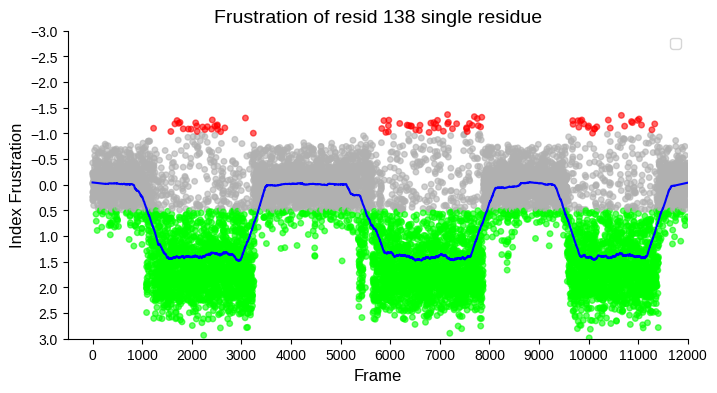

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from scipy.signal import savgol_filter
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression


# Suponiendo que df es tu DataFrame y ya contiene los datos
# data = {'FrstIndex': [...]}  # Datos de ejemplo
# df = pd.DataFrame(data)

# Calcular la media móvil usando el filtro Savitzky-Golay con ventana de 800 y polinomio de 1 para la mayoria excepcion 138/140/145/146 (500 y 1)
window_length = 500  # Tamaño de la ventana para la media móvil 800
poly_order = 1       # Orden del polinomio para el filtro 1
smoothed = savgol_filter(df['FrstIndex'], window_length, poly_order)

# Seleccionar cada 2 datos para reducir la densidad de puntos en el scatter plot
df_sampled = df.iloc[::1]  # Selecciona cada índice

# Crear la figura
plt.figure(figsize=(8, 4))

# Definir los colores según los límites proporcionados
colors = df_sampled['FrstIndex'].apply(lambda x: 'lime' if x > 0.5 else '#B0B0B0' if -1 < x <= 0.5 else 'red')

# Graficar los puntos de dispersión usando el índice del DataFrame como el eje X y reducir el tamaño de los puntos
plt.scatter(df_sampled.index, df_sampled['FrstIndex'], c=colors, s=16, alpha=0.6)

# Ajustar el rango del eje X de -500 a 12000 para agregar una sangría
plt.xlim(-500, 12000)

# Invertir el eje Y y ajustar el rango de -3 a 3
plt.gca().invert_yaxis()
plt.ylim(3, -3)

# Establecer los ticks del eje X cada 1000 unidades
plt.xticks(np.arange(0, 12001, 1000))

# Establecer los ticks del eje Y cada 0.5 unidades
plt.yticks(np.arange(-3.0, 3.5, 0.5))

# Ocultar las líneas superior y derecha del gráfico
plt.gca().spines[['top', 'right']].set_visible(False)

# Agregar la línea de la media móvil al gráfico
plt.plot(df.index, smoothed, color='blue')

# Agregar título y etiquetas de los ejes
plt.title('Frustration of resid 138 single residue', fontsize=14, fontname='Liberation Sans')
plt.xlabel('Frame', fontsize=12, fontname='Liberation Sans')
plt.ylabel('Index Frustration', fontsize=12, fontname='Liberation Sans')

# Mostrar leyenda
plt.legend()

# Guardamos la figura en alta calidad con fondo transparente
plt.savefig('Ile138_Single_residue.png', dpi=1200, transparent=True)

# Mostrar el gráfico
plt.show()

In [ ]:
# Crear el DataFrame y graficar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# @title Distance
# Font
!apt-get install -y fonts-liberation
plt.rcParams['font.family'] = 'Liberation Sans'

# Crear el DataFrame y graficar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Cargar el DataFrame
df = pd.read_csv('/content/drive/MyDrive/Frustra/distances_Energy_frustration.csv', sep='\s+', header=None, names=['Model', 'Distance','Native Energy', 'FrstIndex'], skiprows=1)
df

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


,Model,Distance,Native Energy,FrstIndex
0,1,9.482550,-4.200,-0.027
1,2,9.892693,-2.623,-0.229
2,3,10.337219,-1.050,-0.425
3,4,8.380703,-4.045,0.146
4,5,10.765769,-2.962,-0.018
...,...,...,...,...
11990,11991,9.773418,-4.326,0.121
11991,11992,9.379689,-4.322,-0.015
11992,11993,8.413474,-4.291,0.029
11993,11994,10.400285,-3.136,-0.087


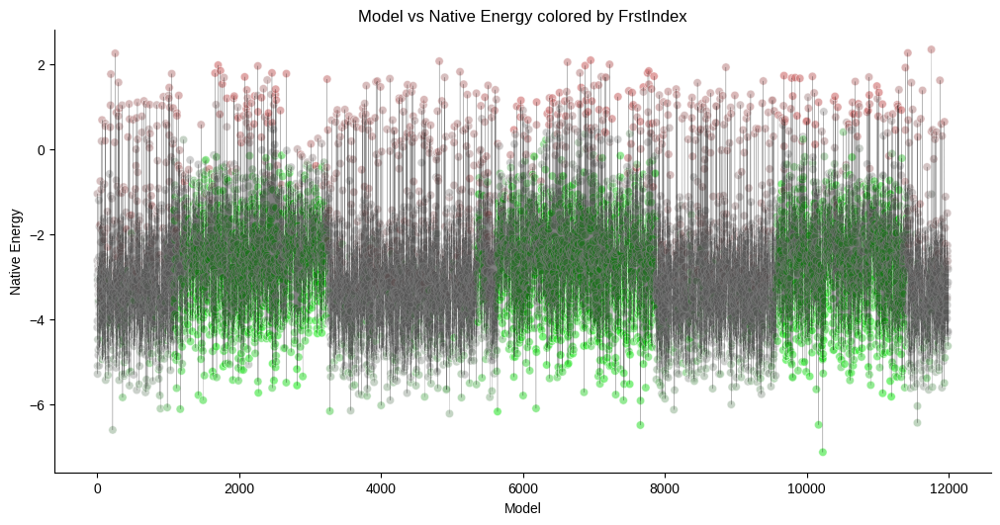

In [ ]:
# @title Model vs Native Energy colored by FrstIndex

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap



# Normalizar los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definir el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lima en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

def _plot_series(series, series_name, series_index=0):
    palette = list(sns.palettes.mpl_palette('Dark2'))
    xs = series['Model']
    ys = series['Native Energy']
    c = series['FrstIndex']
    plt.scatter(xs, ys, c=mymap(norm(c)), label=series_name, alpha=0.6, edgecolors='w', linewidth=0.5)
    plt.plot(xs, ys, c='black', alpha=0.5, linewidth=0.2) # Changed 'label=black' to 'c='black''

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df.sort_values('Model', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Model')
plt.ylabel('Native Energy')
plt.title('Model vs Native Energy colored by FrstIndex')

# Añadir una barra de color (colorbar)
sm = plt.cm.ScalarMappable(cmap=mymap, norm=norm)
sm.set_array([])

#plt.colorbar(sm, label='FrstIndex')

plt.show()


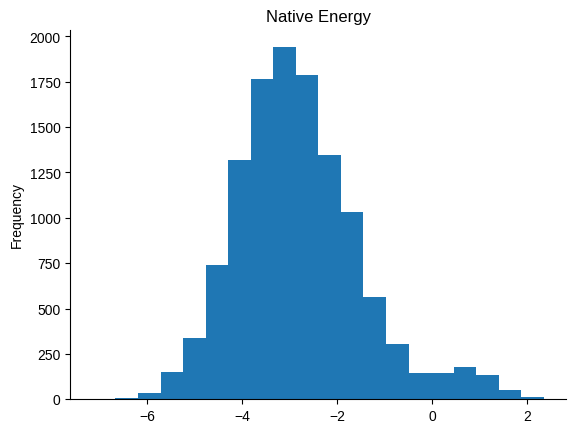

In [ ]:
# @title Native Energy

from matplotlib import pyplot as plt
df['Native Energy'].plot(kind='hist', bins=20, title='Native Energy')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
# @title Distance vs Native Energy

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Distance', y='Native Energy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

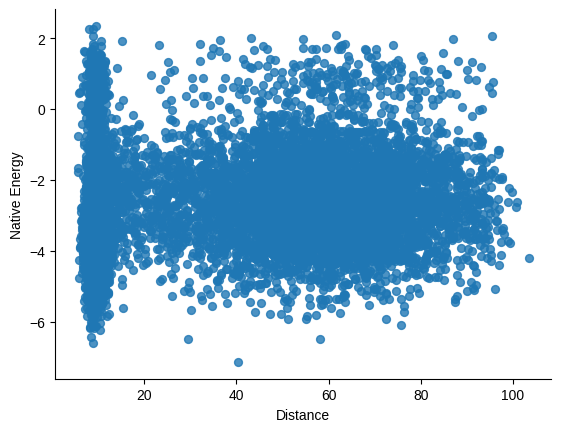

In [ ]:
# @title Distance vs Native Energy

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Distance', y='Native Energy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

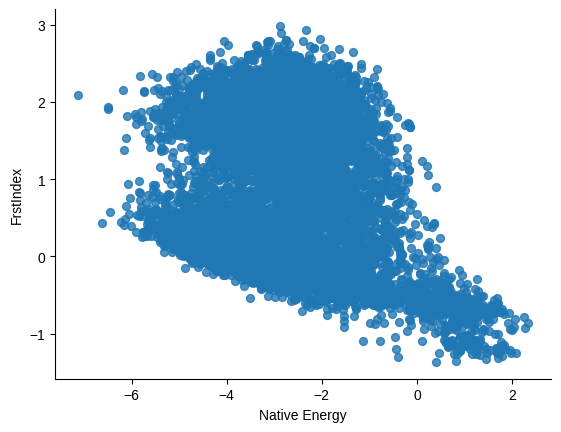

In [ ]:
# @title Native Energy vs FrstIndex

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Native Energy', y='FrstIndex', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

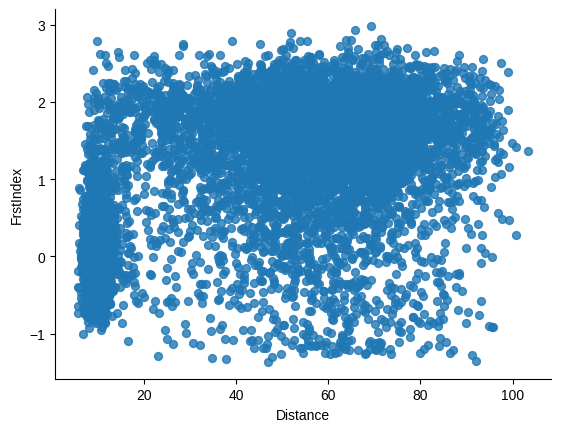

In [ ]:
from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Distance', y='FrstIndex', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColorBar
from bokeh.transform import linear_cmap
from bokeh.layouts import column
from bokeh.palettes import Viridis256
import pandas as pd

# Configura Bokeh para mostrar los gráficos en el notebook
output_notebook()

# Simulación de los datos (reemplazar con la carga de tu DataFrame)
# df = pd.read_csv('ruta/a/tu/archivo.csv')

# Crear un mapa de colores basado en 'FrstIndex'
mapper = linear_cmap(field_name='FrstIndex', palette=Viridis256, low=df['FrstIndex'].min(), high=df['FrstIndex'].max())

# Crear el gráfico de dispersión
# Use 'height' and 'width' to set the plot dimensions
p = figure(title="Distance vs FrstIndex", x_axis_label='Distance', y_axis_label='FrstIndex', height=400, width=700)
p.scatter(x='Distance', y='FrstIndex', source=df, size=8, color=mapper, legend_field='FrstIndex', fill_alpha=0.6)

# Añadir la barra de color
color_bar = ColorBar(color_mapper=mapper['transform'], width=8, location=(0,0))
p.add_layout(color_bar, 'right')

# Mostrar el gráfico
show(p)


In [ ]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColorBar
from bokeh.transform import linear_cmap
import pandas as pd
import numpy as np

# Configura Bokeh para mostrar los gráficos en el notebook
output_notebook()


# Definir los colores según los límites proporcionados
def color_by_frstindex(frstindex):
    if frstindex > 0.5:
        return 'lime'
    elif -1 < frstindex <= 0.5:
        return '#B0B0B0'
    else:
        return 'red'

df['color'] = df['FrstIndex'].apply(color_by_frstindex)

# Normalizar los valores de 'FrstIndex' para el colormap
min_val = df['FrstIndex'].min()
max_val = df['FrstIndex'].max()

# Crear un mapa de colores basado en 'FrstIndex'
mapper = linear_cmap(field_name='FrstIndex', palette='Viridis256', low=min_val, high=max_val)

# Crear el gráfico de dispersión con colores personalizados
p = figure(title="Distance vs FrstIndex", x_axis_label='Distance', y_axis_label='FrstIndex', height=400, width=700)
p.scatter(x='Distance', y='FrstIndex', source=df, size=8, color='color', legend_field='FrstIndex', fill_alpha=0.6)

# Añadir la barra de color
color_bar = ColorBar(color_mapper=mapper['transform'], width=8, location=(0,0))
p.add_layout(color_bar, 'right')

# Mostrar el gráfico
show(p)


In [ ]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColorBar
from bokeh.transform import linear_cmap
import pandas as pd
import numpy as np

# Configura Bokeh para mostrar los gráficos en el notebook
output_notebook()

# Simulación de datos para el ejemplo

# Definir los colores según los límites proporcionados
def color_by_frstindex(frstindex):
    if frstindex > 0.5:
        return 'lime'
    elif -1 < frstindex <= 0.5:
        return '#B0B0B0'
    else:
        return 'red'

df['color'] = df['FrstIndex'].apply(color_by_frstindex)

# Normalizar los valores de 'FrstIndex' para el colormap
min_val = df['FrstIndex'].min()
max_val = df['FrstIndex'].max()

# Crear un mapa de colores basado en 'FrstIndex'
mapper = linear_cmap(field_name='FrstIndex', palette='Viridis256', low=min_val, high=max_val)

# Crear el gráfico de dispersión con colores personalizados
p = figure(title="Distance vs FrstIndex", x_axis_label='Distance', y_axis_label='FrstIndex', height=400, width=700)
p.scatter(x='Distance', y='FrstIndex', source=df, size=8, color='color', legend_field='FrstIndex', fill_alpha=0.6)

# Añadir la barra de color
color_bar = ColorBar(color_mapper=mapper['transform'], width=8, location=(0,0))
p.add_layout(color_bar, 'right')

# Mostrar el gráfico
show(p)


In [ ]:
import plotly.express as px

import plotly.express as px
import pandas as pd
import numpy as np



# Definir los colores según los límites proporcionados
colors = df['FrstIndex'].apply(lambda x: 'lime' if x > 0.5 else '#B0B0B0' if -1 < x <= 0.5 else 'red')

# Crear un gráfico 3D usando Plotly Express
fig = px.scatter_3d(df, x='Distance', y='FrstIndex', z='Native Energy',
                    color=colors,  # Usar los colores definidos
                    title='3D Scatter Plot of Distance, FrstIndex, and Native Energy',
                    color_discrete_map={  # Mapa de colores explícito si es necesario
                        'lime': 'lime',
                        '#B0B0B0': '#B0B0B0',
                        'red': 'red'
                    })

# Mostrar el gráfico
fig.show()



In [ ]:
import plotly.express as px
!apt-get install -y fonts-liberation
plt.rcParams['font.family'] = 'Liberation Sans'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define a Plotly compatible colorscale based on your Matplotlib colors
colorscale = [
    [0, 'red'],
    [0.45, '#B0B0B0'],
    [0.55, '#B0B0B0'],
    [1, 'lime']
]

# Create a 3D scatter plot with Plotly Express
fig = px.scatter_3d(df, x=df['Model'], z=df['FrstIndex'], y=df['Native Energy'],
                    color='FrstIndex', color_continuous_scale=colorscale, # Use the Plotly colorscale
                    title='3D Scatter Plot of Native Energy, FrstIndex, and Model')

# Show the plot
fig.show()






Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


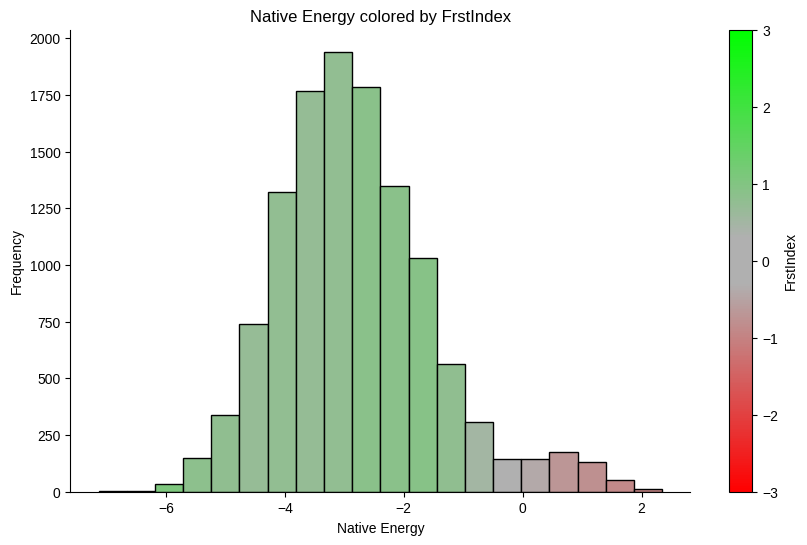

In [ ]:
# @title Native Energy colored by FrstIndex

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Simulación de los datos (puedes cargar tu archivo CSV aquí)


# Normalizar los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definir el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.45, "#B0B0B0"), # Gris claro en -0.15
    (0.55, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lima en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Crear los bins para el histograma
num_bins = 20
bins = np.linspace(df['Native Energy'].min(), df['Native Energy'].max(), num_bins + 1)

# Crear la figura y los ejes
fig, ax = plt.subplots(figsize=(10, 6))

# Calcular el color de cada bin
bin_colors = []
for i in range(num_bins):
    bin_mask = (df['Native Energy'] >= bins[i]) & (df['Native Energy'] < bins[i + 1])
    bin_frstindex_mean = df.loc[bin_mask, 'FrstIndex'].mean()
    bin_color = mymap(norm(bin_frstindex_mean))
    bin_colors.append(bin_color)

# Dibujar el histograma con los colores correspondientes
hist, edges = np.histogram(df['Native Energy'], bins=bins)
for i in range(num_bins):
    ax.bar(edges[i], hist[i], width=edges[i + 1] - edges[i], color=bin_colors[i], edgecolor='black', align='edge')

# Configurar las etiquetas y el título
ax.set_xlabel('Native Energy')
ax.set_ylabel('Frequency')
ax.set_title('Native Energy colored by FrstIndex')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Añadir una barra de color (colorbar)
sm = plt.cm.ScalarMappable(cmap=mymap, norm=norm)
sm.set_array([])
plt.colorbar(sm, ax=ax, label='FrstIndex')

# Mostrar la gráfica
plt.show()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


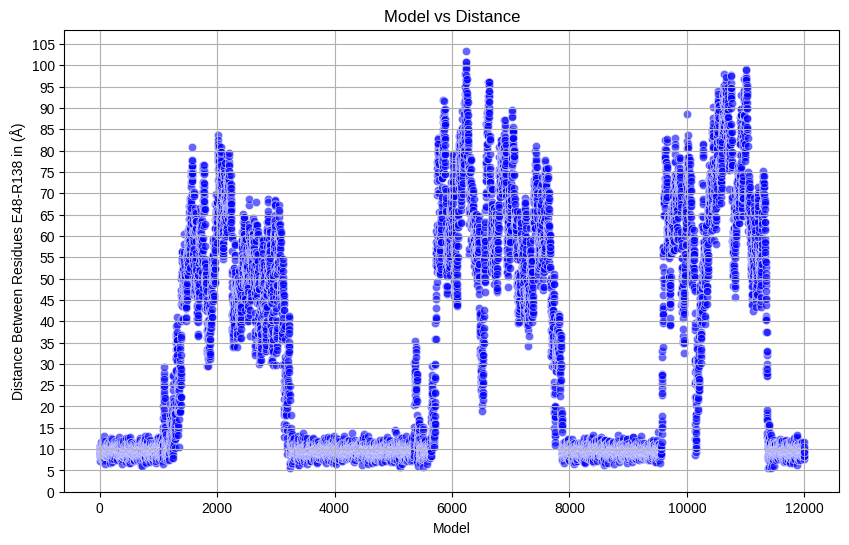

In [ ]:
# @title Distance
# Font
!apt-get install -y fonts-liberation
plt.rcParams['font.family'] = 'Liberation Sans'

# Crear el DataFrame y graficar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt



# Crear la gráfica de puntos
plt.figure(figsize=(10, 6))
plt.scatter(df['Model'], df['Distance'], color='b', alpha=0.6, edgecolors='w', linewidth=0.5)

# Etiquetas de los ejes
plt.xlabel('Model')
plt.ylabel('Distance Between Residues E48-R138 in (Å)')
plt.title('Model vs Distance')

# Ajustar los ticks del eje Y para que vayan de 5 en 5
max_distance = df['Distance'].max()
plt.yticks(np.arange(0, max_distance + 5, 5))

# Mostrar la gráfica
plt.grid(True)
plt.show()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


<ipython-input-64-91166866d364>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='FrstIndex')
<ipython-input-64-91166866d364>:57: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='FrstIndex')


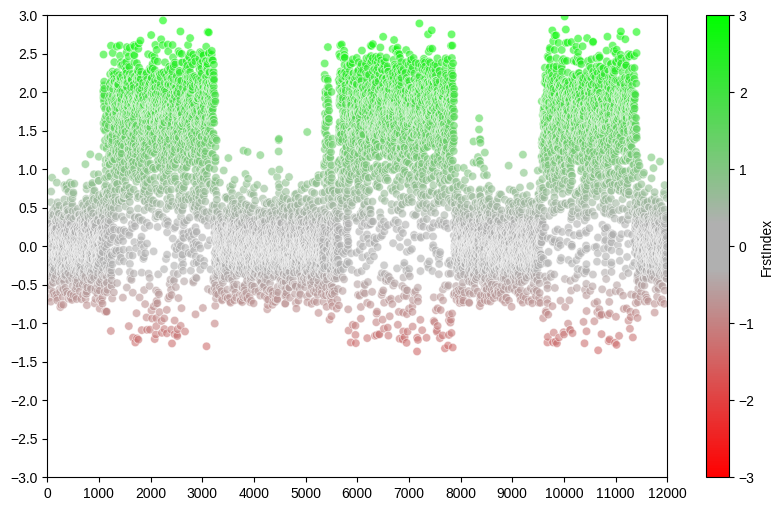

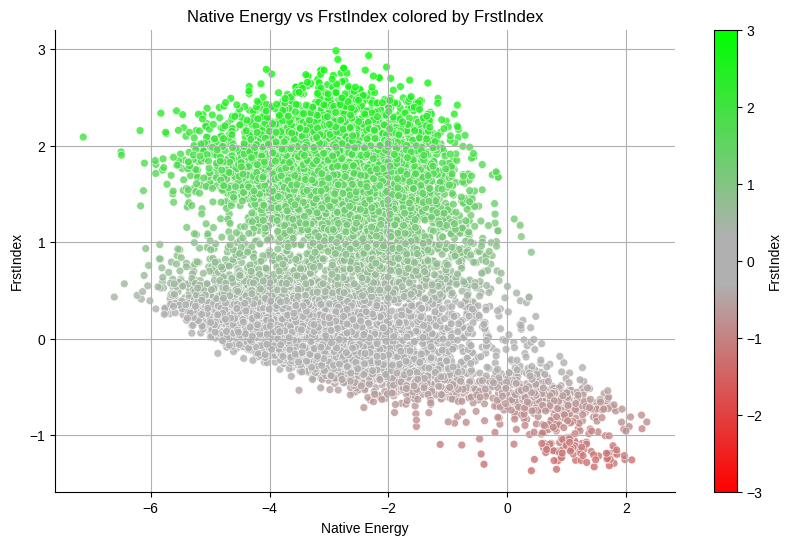

In [ ]:
# @title Distance and Native Energy vs FrstIndex
# Font
!apt-get install -y fonts-liberation
plt.rcParams['font.family'] = 'Liberation Sans'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Cargar el DataFrame
df = pd.read_csv('/content/drive/MyDrive/Frustra/distances_Energy_frustration.csv', sep='\s+', header=None, names=['Model', 'Distance', 'Native Energy', 'FrstIndex'], skiprows=1)

# Normalizar los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definir el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.45, "#B0B0B0"), # Gris claro en -0.25
    (0.55, "#B0B0B0"), # Gris claro en 0.25
    (1, "lime")         # Verde Lima en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Crear la primera gráfica de puntos (Model vs Distance colored by FrstIndex)
plt.figure(figsize=(10, 6))
plt.scatter(df['Model'], df['FrstIndex'], c=mymap(norm(df['FrstIndex'])), alpha=0.6, edgecolors='w', linewidth=0.5)

# Ajustar el rango del eje X de 0 a 120
plt.xlim(0, 12000)
plt.ylim(-3, 3)

# Añadir una barra de color (colorbar)
sm = plt.cm.ScalarMappable(cmap=mymap, norm=norm)
sm.set_array([])
plt.colorbar(sm, label='FrstIndex')

# Ajustar el rango del eje X de 0 a 120
# Establecer los ticks del eje X cada 1000 unidades
plt.xticks(np.arange(0, 12001, 1000))

# Establecer los ticks del eje Y cada 0.5 unidades
plt.yticks(np.arange(-3.0, 3.5, 0.5))

# Crear la segunda gráfica de dispersión (Native Energy vs FrstIndex) con colores basados en FrstIndex
plt.figure(figsize=(10, 6))
plt.scatter(df['Native Energy'], df['FrstIndex'], c=mymap(norm(df['FrstIndex'])), s=32, alpha=0.8, edgecolors='w', linewidth=0.5)
plt.xlabel('Native Energy')
plt.ylabel('FrstIndex')
plt.title('Native Energy vs FrstIndex colored by FrstIndex')
plt.gca().spines[['top', 'right']].set_visible(False)

# Añadir una barra de color (colorbar) para la segunda gráfica
sm = plt.cm.ScalarMappable(cmap=mymap, norm=norm)
sm.set_array([])
plt.colorbar(sm, label='FrstIndex')

# Mostrar la segunda gráfica
plt.grid(True)
plt.show()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


<ipython-input-80-bd93c1be0c23>:41: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='FrstIndex')


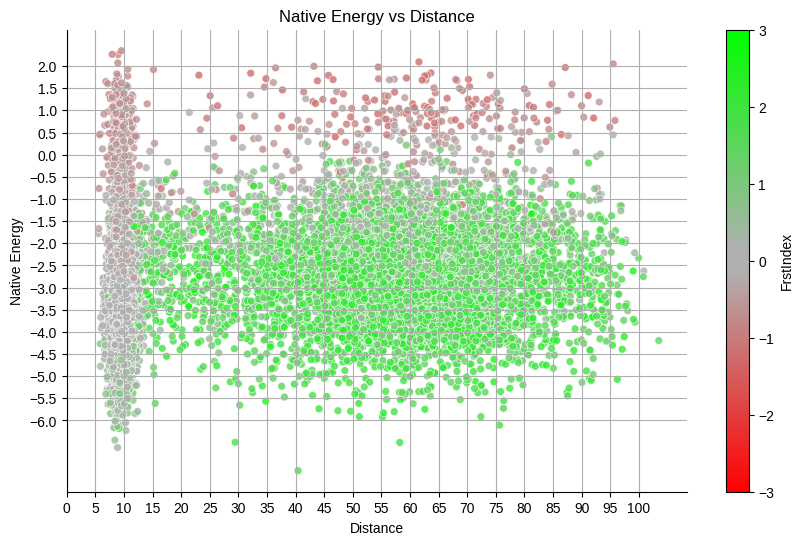

In [ ]:
# @title Distance and Native Energy vs FrstIndex
# Font
!apt-get install -y fonts-liberation
plt.rcParams['font.family'] = 'Liberation Sans'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Cargar el DataFrame
df = pd.read_csv('/content/drive/MyDrive/Frustra/distances_Energy_frustration.csv', sep='\s+', header=None, names=['Model', 'Distance', 'Native Energy', 'FrstIndex'], skiprows=1)

# Normalizar los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definir el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.475, "#B0B0B0"), # Gris claro en -0.15
    (0.525, "#B0B0B0"), # Gris claro en 0.15
    (1, "lime")         # Verde Lima en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Crear la segunda gráfica de dispersión (Native Energy vs FrstIndex) con colores basados en FrstIndex
plt.figure(figsize=(10, 6))
plt.scatter( df['Distance'],df['Native Energy'], c=mymap(norm(df['FrstIndex'])), s=32, alpha=0.8, edgecolors='w', linewidth=0.5)
plt.xlabel('Distance')\
# Establecer los ticks del eje X cada 1000 unidades
plt.xticks(np.arange(0, 105, 5))
plt.ylabel('Native Energy')
# Establecer los ticks del eje Y cada 0.5 unidades
plt.yticks(np.arange(-6, 2.5, 0.5))
plt.title('Native Energy vs Distance')
plt.gca().spines[['top', 'right']].set_visible(False)

# Añadir una barra de color (colorbar) para la segunda gráfica
sm = plt.cm.ScalarMappable(cmap=mymap, norm=norm)
sm.set_array([])
plt.colorbar(sm, label='FrstIndex')

# Mostrar la segunda gráfica
plt.grid(True)
plt.show()


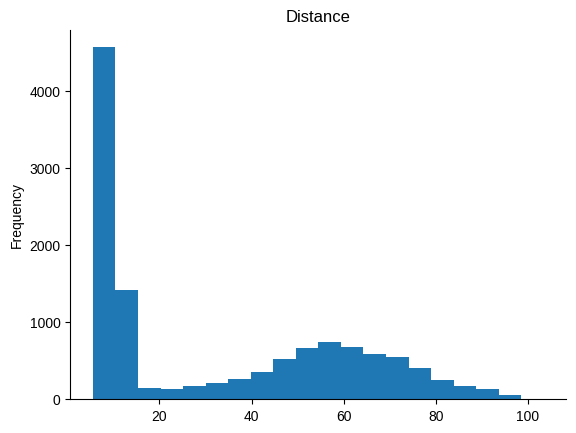

In [ ]:
# @title Distance

from matplotlib import pyplot as plt
df['Distance'].plot(kind='hist', bins=20, title='Distance')
plt.gca().spines[['top', 'right',]].set_visible(False)

<ipython-input-76-b72c55234dea>:35: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Native Energy')


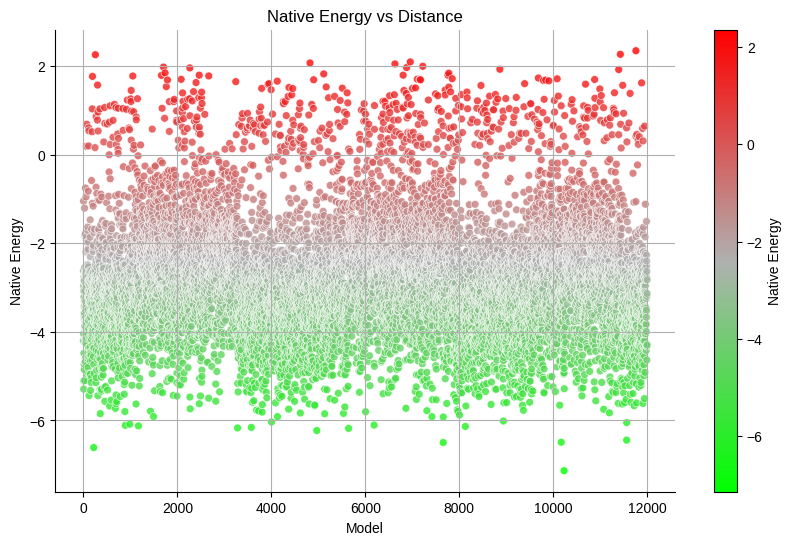

In [ ]:
# @title Distance and Native Energy vs Native Energy
# Font
plt.rcParams['font.family'] = 'Liberation Sans'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LinearSegmentedColormap

# Cargar el DataFrame
df = pd.read_csv('/content/drive/MyDrive/Frustra/distances_Energy_frustration.csv', sep='\s+', header=None, names=['Model', 'Distance', 'Native Energy', 'FrstIndex'], skiprows=1)

# Normalizar los valores de 'Native Energy' al rango [min, max] para el colormap
norm = Normalize(df['Native Energy'].min(), df['Native Energy'].max())

# Definir el colormap personalizado con colores específicos
colors = [
    (0, "lime"),   # Azul para el mínimo
    (0.5, "#B0B0B0"), # Blanco en el punto medio
    (1, "red")     # Rojo para el máximo
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Crear la gráfica de dispersión (Native Energy vs Distance) con colores basados en Native Energy
plt.figure(figsize=(10, 6))
plt.scatter( df['Model'], df['Native Energy'], c=mymap(norm(df['Native Energy'])), s=32, alpha=0.8, edgecolors='w', linewidth=0.5)
plt.xlabel('Model')
plt.ylabel('Native Energy')
plt.title('Native Energy vs Distance')
plt.gca().spines[['top', 'right']].set_visible(False)

# Añadir una barra de color (colorbar) para la gráfica
sm = plt.cm.ScalarMappable(cmap=mymap, norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Native Energy')

# Mostrar la gráfica
plt.grid(True)
plt.show()


## Bokeh

### Sample

In [ ]:
import numpy as np
from bokeh.plotting import figure, show
from bokeh.io import output_notebook

# Call once to configure Bokeh to display plots inline in the notebook.
output_notebook()

In [ ]:
# @title Distance and Native Energy vs FrstIndex
# Font
!apt-get install -y fonts-liberation
plt.rcParams['font.family'] = 'Liberation Sans'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Cargar el DataFrame
df = pd.read_csv('/content/drive/MyDrive/Frustra/distances_Energy_frustration.csv', sep='\s+', header=None, names=['Model', 'Distance', 'Native Energy', 'FrstIndex'], skiprows=1)

# Normalizar los valores de 'FrstIndex' al rango [-3, 3]
norm = plt.Normalize(-3, 3)

# Definir el colormap personalizado con los colores específicos
colors = [
    (0, "red"),         # Rojo en -3
    (0.45, "#B0B0B0"), # Gris claro en -0.25
    (0.55, "#B0B0B0"), # Gris claro en 0.25
    (1, "lime")         # Verde Lima en 3
]
mymap = LinearSegmentedColormap.from_list('my_colormap', colors)

# Crear la primera gráfica de puntos (Model vs Distance colored by FrstIndex)
plt.figure(figsize=(10, 6))
plt.scatter(df['Model'], df['FrstIndex'], c=mymap(norm(df['FrstIndex'])), alpha=0.6, edgecolors='w', linewidth=0.5)

# Ajustar el rango del eje X de 0 a 120
plt.xlim(0, 12000)
plt.ylim(-3, 3)

# Añadir una barra de color (colorbar)
sm = plt.cm.ScalarMappable(cmap=mymap, norm=norm)
sm.set_array([])
plt.colorbar(sm, label='FrstIndex')

# Ajustar el rango del eje X de 0 a 120
# Establecer los ticks del eje X cada 1000 unidades
plt.xticks(np.arange(0, 12001, 1000))

# Establecer los ticks del eje Y cada 0.5 unidades
plt.yticks(np.arange(-3.0, 3.5, 0.5))

# Crear la segunda gráfica de dispersión (Native Energy vs FrstIndex) con colores basados en FrstIndex
plt.figure(figsize=(10, 6))
plt.scatter(df['Native Energy'], df['FrstIndex'], c=mymap(norm(df['FrstIndex'])), s=32, alpha=0.8, edgecolors='w', linewidth=0.5)
plt.xlabel('Native Energy')
plt.ylabel('FrstIndex')
plt.title('Native Energy vs FrstIndex colored by FrstIndex')
plt.gca().spines[['top', 'right']].set_visible(False)

# Añadir una barra de color (colorbar) para la segunda gráfica
sm = plt.cm.ScalarMappable(cmap=mymap, norm=norm)
sm.set_array([])
plt.colorbar(sm, label='FrstIndex')

# Mostrar la segunda gráfica
plt.grid(True)
plt.show()

In [ ]:
%%writefile clusters.txt
    AA Res Cluster       Mean        Sd FrstRange
1  TYR   5       2  0.4911088 0.1441879 0.8414569
2  ALA  25       1 -0.8916000 0.1455156 0.7388396
3  ALA  45       1 -0.5729715 0.1315800 0.7758474
4  GLU  62       1 -0.7575830 0.1428516 0.7801943
5  ALA  86       2  0.2804900 0.1873925 1.1130008
6  ILE  87       2  1.5565627 0.1844821 1.0353512
7  ALA  91       1 -0.5809670 0.1757491 0.9315020
8  VAL  92       2  0.8354547 0.3815914 1.1759143
9  HIS  94       1 -0.5664618 0.1802305 0.7661795
10 LEU  96       2  0.7011585 0.2232373 0.7487295
11 TYR 111       1 -2.4827182 0.1970119 1.1318555
12 VAL 116       2  0.7497800 0.1282326 0.7434412
13 GLU 120       1 -0.9263096 0.1534130 0.8068601
14 ALA 122       1 -0.8272318 0.2061738 0.9698005
15 PHE 126       3  0.3780706 0.2062117 0.9604619
16 PHE 130       3  0.3470473 0.2045474 0.9553527
17 GLU 132       1 -0.8954044 0.1610489 0.7648110
18 LEU 143       2  1.0149976 0.1592809 0.7280656
19 LEU 145       2  0.8168915 0.2817535 1.1230369
20 ILE 146       2  1.2913760 0.5101922 1.7843263
21 ASN 147       1 -0.6603607 0.2207111 0.9510621
22 ILE 150       2  1.4349781 0.3115758 1.3872822
23 ASN 156       1 -0.5898432 0.1726509 0.9283665
24 GLU 158       2  1.5499651 0.1388317 1.0403928
25 ARG 160       2  1.2377452 0.1736729 0.9070942
26 LEU 162       1 -0.6219630 0.1346737 0.7421549

Overwriting clusters.txt


In [ ]:
#craer data frame y graficar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
df = pd.read_csv('clusters.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df


,N,AA,Res,Cluster,Mean,Sd,FrstRange
0,1,TYR,5,2,0.491109,0.144188,0.841457
1,2,ALA,25,1,-0.891600,0.145516,0.738840
2,3,ALA,45,1,-0.572971,0.131580,0.775847
3,4,GLU,62,1,-0.757583,0.142852,0.780194
4,5,ALA,86,2,0.280490,0.187392,1.113001
5,6,ILE,87,2,1.556563,0.184482,1.035351
6,7,ALA,91,1,-0.580967,0.175749,0.931502
7,8,VAL,92,2,0.835455,0.381591,1.175914
8,9,HIS,94,1,-0.566462,0.180230,0.766180
9,10,LEU,96,2,0.701159,0.223237,0.748730


In [ ]:
!pip install leidenalg
#usar lidenlg en el data frame
import pandas as pd
import leidenalg as la
import numpy as np
import matplotlib.pyplot as plt

#cargar data frame
df = pd.read_csv('clusters.txt', sep='\s+', header=None, names=['N','AA', 'Res', 'Cluster', 'Mean', 'Sd', 'FrstRange'], skiprows=1)
df



,N,AA,Res,Cluster,Mean,Sd,FrstRange
0,1,TYR,5,2,0.491109,0.144188,0.841457
1,2,ALA,25,1,-0.891600,0.145516,0.738840
2,3,ALA,45,1,-0.572971,0.131580,0.775847
3,4,GLU,62,1,-0.757583,0.142852,0.780194
4,5,ALA,86,2,0.280490,0.187392,1.113001
5,6,ILE,87,2,1.556563,0.184482,1.035351
6,7,ALA,91,1,-0.580967,0.175749,0.931502
7,8,VAL,92,2,0.835455,0.381591,1.175914
8,9,HIS,94,1,-0.566462,0.180230,0.766180
9,10,LEU,96,2,0.701159,0.223237,0.748730


In [ ]:
from PIL import Image

# Cargar la imagen
imagen = Image.open("Rplot_cluster.png")

# Convertir la imagen a modo RGBA si no está en ese modo
if imagen.mode != 'RGBA':
    imagen = imagen.convert('RGBA')

# Definir el color a reemplazar (en este caso, rojo)
color_a_reemplazar = (255, 0, 0, 255)

# Definir el nuevo color (en este caso, verde)
nuevo_color = (0, 255, 0, 255)

# Obtener los datos de píxeles de la imagen
datos_pixeles = imagen.getdata()

# Convertir los datos de píxeles a una lista para poder modificarla
datos_pixeles_lista = list(datos_pixeles)

# Iterar sobre cada píxel en la lista de datos de píxeles
for i, pixel in enumerate(datos_pixeles_lista):
    # Si el píxel es igual al color a reemplazar, cambiarlo por el nuevo color
    if pixel == color_a_reemplazar:
        datos_pixeles_lista[i] = nuevo_color

# Actualizar la imagen con los nuevos datos de píxeles
imagen.putdata(datos_pixeles_lista)

# Guardar la imagen modificada
imagen.save("imagen_modificada.png")

# Mostrar la imagen modificada
imagen.show()
